# Data Mining - Handin 2 - Graph mining

This handin corresponds to the topics in Week 10-15 in the course.

The handin is 
* done in the chosen handin groups
* worth 10% of the grade

For the handin, you will prepare a report in PDF format, by exporting the Jupyter notebook. 
Please submit
1. The jupyter notebook file with your answers
2. The PDF obtained by exporting the jupyter notebook

Submit both files on Brightspace no later than **April 21 kl. 11.59PM**.

**The grading system**: Tasks are assigned a number of points based on the difficulty and time to solve it. The sum of
the number of points is **100**. For the maximum grade you need to get at least _80 points_. The minimum grade (02 in the Danish scale)
requires **at least** 30 points, with at least 8 points on of the first three Parts (Part 1,2,3) and 6 points in the last part (Part 4).
Good luck!

**The exercise types**: There are three different types of exercises
1. <span style='color: green'>**\[Compute by hand\]**</span> means that you should provide **NO code**, but show the main steps to reach the result (not all).  
2. <span style='color: green'>**\[Motivate\]**</span> means to provide a short answer of 1-2 lines indicating the main reasoning, e.g., the PageRank of a complete graph is 1/n in all nodes as all nodes are symmetric and are connected one another.
3. <span style='color: green'>**\[Describe\]**</span> means to provide a potentially longer answer of 1-5 lines indicating the analysis of the data and the results. 
4. <span style='color: green'>**\[Prove\]**</span> means to provide a formal argument and NO code. 
5. <span style='color: green'>**\[Implement\]**</span> means to provide an implementation. Unless otherwise specified, you are allowed to use helper functions (e.g., ```np.mean```, ```itertools.combinations```, and so on). However, if the task is to implement an algorithm, by no means a call to a library that implements the same algorithm will be deemed as sufficient! 

In [2]:
### BEGIN IMPORTS - DO NOT TOUCH!
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
import sys
sys.path.append('..')
#!{sys.executable} -m pip install matplotlib
#!{sys.executable} -m pip install networkx
#!{sys.executable} -m pip install torchvision
import random
import scipy.io as sio
import time

import networkx as nx
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt

import csv
from itertools import count


import torch
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms


from utilities.load_data import load_mnist
import utilities.email as email
from utilities.mnist import *

from utilities.make_graphs import read_edge_list, read_list, load_data

### END IMPORTS - DO NOT TOUCH!

/Users/dexterlam/Desktop/Aarhus.Universitet/Kandidat/2.semester/Data mining/DM-Hand-In/handins


## Task 1.1 Random walks and PageRank  (12 points)

In this exercise recall that the PageRank is defined as 

$$\mathbf{r} = \alpha \mathbf{Mr} + (1-\alpha)\mathbf{p}$$ 

where $\mathbf{r}\in \mathbb{R}^n$ is the PageRank vector, $\alpha$ is the restart probability, $\mathbf{M} = A\Delta^{-1}$, and $\mathbf{p}$ is the restart (or personalization) vector. 

**************************************
### Task 1.1.1 (4 points)
What is the PageRank of a **$d$-regular** graph with $n$ nodes and $\alpha=1$? 

<span style='color: green'>**\[Motivate\]**</span> your answer without showing the exact computation.


*************************************
**Answer:**

As we have that $\alpha = 1$, we get that $r = Mr$. Therefore we can find the PageRank of the graph by finding its eigenvector corresponding the the eigenvalue of 1. As we have a $d$-regular graph, we will notice that all nodes become symmetrical. And therefore, we will find that the eigenvector will be the same for all nodes. This means that the PageRank of all nodes will be the same. And as we have $n$ nodes, we will find that the PageRank of all nodes will be $1/n$.

*************************************

### Task 1.1.2 (6 points)
Look at the graph below (run the code) and try make a guess about the PageRank values of each node only by reasoning on the graph's connections.

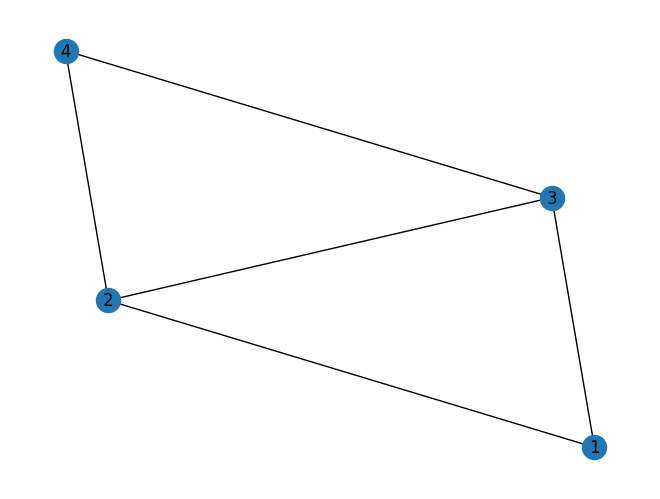

In [3]:
G = nx.Graph()
G.add_edges_from([(1,2), (2,3), (2,4), (3,4), (1,3)])
nx.draw(G, with_labels=True, )

<span style='color: green'>**A) \[Implement\]**</span> the PageRank for $\alpha=1$ for the graph using the Power Iteration method (use $\epsilon=1e-16$ to stop the iteration).<br> 

<span style='color: green'>**B) \[Implement\]**</span> Plot the norm square difference of the $r$ vector (between any two consecutive iterations) for each iteration.

<span style='color: green'>**C) \[Motivate\]**</span> Do you observe a constant decrease of the norm square difference as iterations are increasing, and is this decrease expected or not?

<span style='color: green'>**D) \[Implement\]**</span> the PageRank for $\alpha=1$ using the eigenvector method.<br> 

<span style='color: green'>**E) \[Motivate\]**</span> Are solutions of both methods the same? Why don't we only use the eigenvector method that optimally solves the problem? 

<span style='color: green'>**F) \[Motivate\]**</span> Do the real vector match with your first guess? Can you see a pattern between the pagerank score of each node and its edges?   

In [4]:
#A) YOUR CODE HERE 

# Initialize

G_use = list(G.edges) - np.array([1,1])

x = list(zip(*G_use))[0]
y = list(zip(*G_use))[1]
nodes = list(set(x+y))
NumNodes = len(nodes)

# Create adjacency matrix
A = np.zeros((len(nodes), len(nodes)))

for index in G_use:
    A[index[0],index[1]] = 1
    A[index[1],index[0]] = 1

# Create degree matrix
D = np.zeros((len(nodes), len(nodes)))

for i in range(len(nodes)):
    D[i,i] = np.sum(A[i,:])

# Create the transition matrix
M = A.T@np.linalg.inv(D)

# Set equal weight for all nodes
r = np.array([1/NumNodes]*NumNodes)

# Keep track of the history
history = [0.1]

# Start the Power Iteration
update = True
while update:
    # Update the rank
    r_new = M@r

    # Get the norm of the difference
    history.append(np.linalg.norm(r_new-r)**2)

    # Check if the rank is converged
    if np.linalg.norm(r_new-r) < 1e-16:
        update = False
    r = r_new

print(r)


[0.2 0.3 0.3 0.2]


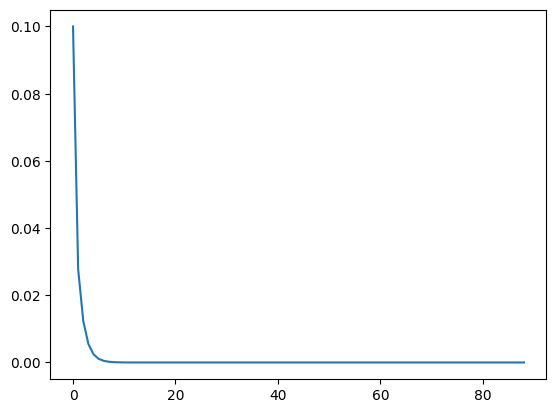

In [5]:
#B) YOUR CODE HERE 

plt.plot(history)
plt.show()

**C) Answer:**

Yes we do. And this is expected, as we are starting with an equal assignment to each node, even though that we do not have that all the nodes are symmetrically connected. Therefore, with each iteration, we will find that the nodes with more connections will have a higher PageRank, as they will have a higher probability of being visited (Given that the transition matrix puts equal weight on each outgoing node). So for each iteration, we will get closer to the true PageRank of each vertex, thus the norm square difference will decrease.

D) **Answer:**

As we again have that $\alpha = 1$, we get that $r = Mr$. Therefore we can find the PageRank of the graph by finding its eigenvector corresponding to the eigenvalue of 1. Thus we get that $\lambda r = Mr$.

In [6]:
from sympy import Eq, solve, Symbol

#First, we need to define the variables that we want to solve for, which is the vector of x. we order them in a list starting from x1 to xn
variablenames = []
for i in range(len(nodes)):
    variablenames.append('x' + str(i+1))


#We now need to define the symbols for the variables using the sympy library where we define each variable as a symbol which we
#can use in the equations
for i in range(len(nodes)):
    variablenames[i] = Symbol(variablenames[i])


#We now need to define the equations that we want to solve.
#The eigenvalue equation is given by Mx = λx where M is the transition matrix and x is the vector of the ranks of the nodes.
#In our case, we want to solve for the eigenvector x, where $\lambda = 1$.
# We do this by calculating left hand side of the equation.

# We do this by multiplying the transition matrix with the vector of x. These are the n equations that we want to solve for the n variables.
LHS=M@variablenames

#We want to define n equations +1 to solve for n variables and also take into count the fact that the sum of the eigenvector is 1.
#We do this by defining the equations as a list of equations and then solve them using the solve function from the sympy library.
equation= [0]*(len(LHS)+1)
for i in range(len(LHS)):
    equation[i] = Eq(LHS[i], variablenames[i])

#We define the last equation such that the sum of the eigenvector is 1.
equation[-1] = Eq(sum(variablenames), 1)



# We can now solve the equations for the variables
solutions = solve(equation, variablenames)

print(solutions)

{x1: 0.200000000000000, x2: 0.300000000000000, x3: 0.300000000000000, x4: 0.200000000000000}


In [7]:
# import numpy as np
# from scipy.optimize import minimize

# # Define the objective function
# def obj(x):
#     # Compute the distance from the zero vector
#     obj_val = np.linalg.norm(((M - np.diag(np.ones(M.shape[0]))) @ x))**2
#     # Return 0 if the distance is sufficiently close to zero
#     return 0 if np.isclose(obj_val, 0, atol=1e-16) else obj_val

# # Define the equality constraint
# def constraint(x):
#     # We want the eigenvector to sum to 1, and this also ensures that we don't get the zero vector
#     return x.sum() - 1

# # Define the initial guess for the optimization as 1/n for all nodes
# x0 = np.zeros(M.shape[0])

# # Define the constraint dictionary which is necessary for the optimization function
# constraints = {'type': 'eq', 'fun': constraint}

# # Set the max iterations and tolerance level (For better convergence)
# options = {'maxiter': 5000, 'ftol': 1e-16}

# # Minimize the objective function using the SLSQP method
# res = minimize(obj, x0, method='SLSQP', constraints=constraints, options=options)

# # Print the result
# print("Minimum value:", res.fun)
# print(res.x)

E) **Answer:**

The Eigenvector method finds the eigenvector of $M$ directly using linear algebra techniques, whereas the Power Iteration method approximates the eigenvector iteratively using the nature of the transition matrix. The Power Iteration method is simpler and requires less computational resources, but may converge slowly for very large graphs. The Eigenvector method, on the other hand, is more computationally expensive but may be faster for larger graphs and may provide more accurate results.

So, while both methods can be used to solve the PageRank problem, the choice of method depends on the size of the graph and the desired level of accuracy. For small graphs, the Power Iteration method may be sufficient, whereas for larger graphs, the Eigenvector method may be more appropriate.

Therefore, both methods have their advantages and disadvantages, and the choice of method depends on the specific requirements of the application.

F) **Answer:**

Assuming that the question reffers to the real vector as the answer found in question A) and D), and it asks if it matches our guess from task 1.1.1, our guess of $1/n$ (which was not a guess, as we had a d-regular graph), then no. And it has no reason to match, as we have that the graph in task 1.1.2 is not symmetrically connected. And therefore, the PageRank of each node will not be the same.

Yes, we see a clear correlation between the PageRank of each node and the number of edges it has. The nodes with more edges have a higher PageRank, as they have a higher probability of being visited.

In [8]:
# print(A)
N = np.triu(A, k=1)

N@N.T

array([[2., 1., 0., 0.],
       [1., 2., 1., 0.],
       [0., 1., 1., 0.],
       [0., 0., 0., 0.]])

In [9]:
L = D - A
print(L)
eigvals, eigvecs = np.linalg.eig(L)
print(eigvals)
print(eigvecs)

eigvecs[:,0] @ eigvecs[:,1]

x1 = eigvecs[:,1]
x2 = eigvecs[:,2]

# print((x1.T @ L @ x1)/(x1.T @ x1))
# print((x2.T @ L @ x2)/(x2.T @ x2))

# H = np.zeros((4,4))

# H[0,0] = 1
# H[2,2] = 1
# H[0,2] = -1
# H[2,0] = -1

# eigvecs[:,0].T @ H @ eigvecs[:,0]

t = eigvecs[:,3]
t.T @ t

[[ 2. -1. -1.  0.]
 [-1.  3. -1. -1.]
 [-1. -1.  3. -1.]
 [ 0. -1. -1.  2.]]
[-2.22044605e-16  2.00000000e+00  4.00000000e+00  4.00000000e+00]
[[ 5.00000000e-01  7.07106781e-01  5.00000000e-01 -3.07596791e-01]
 [ 5.00000000e-01 -2.70616862e-16 -5.00000000e-01 -2.49869288e-01]
 [ 5.00000000e-01 -4.85722573e-17 -5.00000000e-01  8.65062869e-01]
 [ 5.00000000e-01 -7.07106781e-01  5.00000000e-01 -3.07596791e-01]]


1.0

### Task 1.1.3 (2 points)

<span style='color: green'>**\[Motivate\]**</span><br>

Assume you have embedded the graph in **1.1.2** with a __Linear Embedding__ using unormalized Laplacian matrix of the graph as the similarity matrix. How do you expect the embeddings to be if the embedding dimension is $d = 1$?
(1) Check the correct box below and (2) motivate your answer.

* [ ] Nodes 1, 2, 3, 4 will be placed in the corners of a hypercube
* [x] Nodes 2,3 will have the same embedding while 1,4 will be far from each other.
* [ ] Nodes 1,4 and 2,3 will have very close embeddings.
* [ ] Nodes 3,4 will be very far apart.

<font color='red'>IMPORTANT: Do NOT just choose one answer. Please clarify WHY this is the correct answer.</font>

******************
**Answer:**

As per the lecture notes from lecture 9, "If two nodes are “close” under some definition of similarity, they should be also similar in the embedding space." And so, we see that in the Laplacian matrix, the diagonal elements are the degree of each node. And therefore, we see that the nodes with more edges will have a higher degree, and will be closer to each other in the embedding space. And so, we see that nodes 2 and 3 will have the same embedding, as they have an edge to every node, while as seen in the laplacian matrix entry (1,4) = 0. Meaning that nodes 1 and 4 don't have an edge to each other, and will therefore be the nodes laying furthest away from all others, 'traveling wise', as they have no direct connection to each other. Thus we conclude that 2 and 3 will have the same embedding, while 1 and 4 will be far from each other.

******************

## Task 1.2: Spectral Properties of the Graph Laplacian (17 points)
 <span style='color: green'>**\[Prove\]**</span> **the following properties:**
 You will be given points for each of the properties that you prove, rather than points for the exercise as a whole.

**Note that all question correspond to the eigenvalues of the LAPLACIAN (NOT THE NORMALIZED)**

For a graph with $n$ nodes the eigenvalues of the LAPLACIAN ($L  = D - A$) is sorted in ascending order, i.e.,<br>
**$\lambda_0\leq\lambda_1\leq...\leq\lambda_{n-1}$**

### Task 1.2.1 (1 points)

For all graphs $\lambda_0 = 0$ 

*******************
**Answer:**

We know that the Laplacian matrix is defined as $L = D - A$, where $D$ is the diagonal degree matrix and $A$ is the adjacency matrix of the graph. The diagonal elements of $D$ are the degrees of the nodes, i.e., $d_i=\sum_{j=1}^n a_{ij}$, where $a_{ij}$ is the element in the $i$'th row and $j$'th column of $A$. The Laplacian matrix $L$ is therefore symmetric and has the property that the sum of each row (or column) is zero. From the lecture notes from lecture 6, we have that for any symmetrical matrix, it must hold that all the eigenvalues are non-negative, i.e. $\lambda_i \geq 0$. And so, if we can find a vector $v \neq 0$ such that $Lv = 0$, for a general laplacian matrix L, then we have that $\lambda_0 = 0$ for all laplacian matricies. 

Let L be a laplacian matrix, $v \neq 0$ be a vector. Then let's consider the equation $Lv = \lambda v$. Looking at the left hand side, we can rewrite it as follows:
$$Lv = (D - A)v = Dv - Av.$$

Assume that $v = \bar{1}$, where $\bar{1}$ is a vector of ones. Then we have that $Dv = d$, and $Av = d$, where $d$ if a vector of the degrees of the nodes as desbribed above. This implies that
$$Lv = d - d = 0.$$ 

And in order for the equation to hold, we must have that $\lambda = 0$. Thus we have that $\lambda_0 = 0$ for all laplacian matricies.

It is worth noting, that this holds for all constant vectors $v$, and not just $\bar{1}$.

******************

### Task 1.2.2 (2 points)
For the complete graph, $\lambda_1, \dots, \lambda_{n-1} = n$

******************
**Answer:**

To prove that for the complete graph, $\lambda_1, \dots, \lambda_{n-1} = n$, we need to compute the Laplacian matrix $L$ and its eigenvalues. The Laplacian matrix of a complete graph with $n$ nodes is given by:

$$L = D - A = \begin{pmatrix}
n-1 & 0 & \cdots & 0 \\
0 & n-1 & \cdots & 0 \\
\vdots & \vdots & \ddots & \vdots \\
0 & 0 & \cdots & n-1
\end{pmatrix} - \begin{pmatrix}
0 & 1 & \cdots & 1 \\
1 & 0 & \cdots & 1 \\
\vdots & \vdots & \ddots & \vdots \\
1 & 1 & \cdots & 0
\end{pmatrix} = \begin{pmatrix}
n-1 & -1 & \cdots & -1 \\
-1 & n-1 & \cdots & -1 \\
\vdots & \vdots & \ddots & \vdots \\
-1 & -1 & \cdots & n-1
\end{pmatrix}$$
 
To compute the eigenvalues, we can use the fact that $L$ is a symmetric matrix, so it has $n$ orthogonal eigenvectors that form a basis of $\mathbb{R}^n$. We can find these eigenvectors and eigenvalues using standard linear algebra techniques.

First, note that the sum of the elements in each row of $L$ is $0$, so the vector of all ones is an eigenvector of $L$ with eigenvalue $0$. This is the smallest eigenvalue, which we also proved before

Next, we need to find an eigenvector, which namely needs to be orthogonal to our first eigenvector corresponding to the smallest eigenvalue 0, i.e. $f = \bar{1}$. For two vectors to be orthogonal, it needs to hold that:
$$ f \cdot x = 0 \iff \sum_{i = 1}^n f_i \cdot x_i = 0 \iff \sum_{i = 1}^n x_i = 0 $$
where $f$ is the first eigenvector and $x$ is any other eigenvector.

For any such vector $x$, we have the following relationship to the unnormalized laplacian:

$$
\begin{align}
    \left[ Lx \right]_i &= [(D - A)x]_i\\ 
    &= \sum_{j=1}^n d_{ij}x_j - a_{ij}x_j\\
    &= d_{ii}x_i - \sum_{j = 1}^n a_{ij}x_j\\
    &= d_{ii}x_i - \sum_{j \neq i} a_{ij}x_j\\
    &= (n - 1)x_i - \sum_{j \neq i} a_{ij}x_j\\
    &= n x_i - \underbrace{\left( x_i + \sum_{j \neq i} a_{ij}x_j \right)}_\text{= 0}\\
    &= n x_i
\end{align}
$$ 

Where in equation (3), we have used that $d_{ij} = 0 \, \forall \, i \neq j$, so the only term surviving is the diagonal. \
And in (4), we have used that $a_{ij} = 0 \, \text{for} \, i = j$, and therefore we may take it out of the sum.\
In equation (5), we use the fact that, in a complete graph, the degree of every node is $n-1$.\
Finally in (6), we have used the fact from above that the sum of the eigenvector x is zero, and as we have a complete graph, A will be a matrix of ones, except for the diagonal. Therefore, when we add $x_i$ to the sum, we will get a sum of zero.

Which means that we have $Lx = nx$ for any general eigenvector and therefore it must be that $\lambda_1, \dots, \lambda_{n-1} = n$.

******************

### Task 1.2.3 (3 points)

For all the graphs with $k$ connected components $\lambda_0 = \lambda_1 =...=\lambda_ k = 0$

******************
**Answer:**

We have from task 1.2.1, that for all graphs, $\lambda_0 = 0$. And so we only need to prove that $\lambda_1 = \lambda_2 = \dots = \lambda_k = 0$. As we have $k$ connected components, we can write the Laplacian matrix as: 

$$L = \begin{pmatrix}
L_1 & 0 & \cdots & 0 \\
0 & L_2 & \cdots & 0 \\
\vdots & \vdots & \ddots & \vdots \\
0 & 0 & \cdots & L_k
\end{pmatrix}$$

Where $L_i$ is the Laplacian matrix of the $i$'th connected component. Thereby, we can easily see that, by defining an eigenvector $v$ that has $1$'s on all the nodes in the $i$'th component, and $0$'s everywhere else, we have that $Lv = 0$ for all $i$. And so we have that $\lambda_1 = \lambda_2 = \dots = \lambda_k = 0$. And as these are all different from zero, we get that they are all valid eigenvectors corresponding to the eigenvalue $0$, whilst still being orthogonal to each other by construction.

******************

### Task 1.2.4 (5 points)
Given a graph $G$ with eigenvalues of the laplacian $\lambda_0, \lambda_1,...,\lambda_{n-1}$.<br>
We randomly remove an edge from $G$ and we re-calculate the eigenvalues as $\lambda'_0, \lambda'_1,...,\lambda'_{n-1}$.<br>
Can we have $\lambda'_{i}>\lambda_{i}$ for some $0\leq i\leq n-1$? Why? Why not?

******************
**Answer:**

First let us denote the eigenvalues as $\lambda_1, \lambda_2, \dots, \lambda_n$ for easier notation.

Let $X_i$ be a unit eigenvector of $L$ corresponding to the eigenvalues $\lambda_i$, where $X_1, \ldots, X_{k}$ are the linearly independent and orthogonal to each other. Let $S_k$ be the set of all eigenvectors. Then, if we have a $x \in S_k$, then there exist real numbers $a_1, \ldots, a_k$ such that $x = a_1X_1 + \ldots + a_kX_k$, i.e. it can be written as a linear combination of all the already existing eigenvectors. We know that $X_i^2 = 1$ thus we have that $x^Tx = \sum_{i=1}^k a_i^2 = 1$. Now we get the following:

$$
\begin{align*}

    x^T L' x &= (a_1X_1 + \ldots + a_kX_k)^T L' (a_1X_1 + \ldots + a_kX_k) \\
    &= (a_1X_1 + \ldots + a_kX_k)^T L (a_1X_1 + \ldots + a_kX_k) \\
    &- (a_1X_1 + \ldots + a_kX_k)^T H (a_1X_1 + \ldots + a_kX_k) \\
    &\leq (a_1X_1 + \ldots + a_kX_k)^T L (a_1X_1 + \ldots + a_kX_k) \\
    &= (a_1X_1 + \ldots + a_kX_k)^T (\lambda_1 a_1X_1 + \ldots + \lambda_k a_kX_k) \\
    &= \lambda_1 a_1^2X_1^TX_1 + \ldots + \lambda_k a_k^2X_k^TX_k \\
    &\leq \lambda_k a_1^2X_1^TX_1 + \ldots + \lambda_k a_k^2X_k^TX_k \\
    &= \lambda_k(a_1^2 + \ldots + a_k^2) \\
    &= \lambda_k x^Tx

\end{align*}
$$

Thereby, from the fact that $$\lambda = \min\frac{x^T L x}{x^Tx},$$ where $x \neq 0$ and all eigenvectors are orthogonal to eachother. We can thus conclude that, as $x^T L' x \leq \lambda_k x^Tx$ for all $x \in S_k$, then we have that $\lambda_1' \leq \ldots \leq \lambda_k' \leq \lambda_k$. And so we have that $\lambda_0' \leq \lambda_0 \leq \lambda_1' \leq \lambda_1 \leq \dots \leq \lambda_{n-1}' \leq \lambda_{n-1}$.

******************

### Task 1.2.5 (6 points)
Suppose that the graph $G$ consists of two connected componentes of equal size named  $G_1$ and $G_2$. For simplicity assume that $n$ is even.<br>
The Laplacian of $G_1$ has eigenvalues $\lambda^1_0,\lambda^1_1,...,\lambda^1_{n/2-1}$.<br>
The Laplacian of $G_2$ has eigenvalues $\lambda^2_0,\lambda^2_1,...,\lambda^2_{n/2-1}$.<br>
Prove that the  Laplacian of $G$ is consisted of the eigenvalues of the Laplacians of $G_1$ and $G_2$ in ascending order.

******************
**Answer:**

Let L be the laplacian of the graph G 

$$L = \begin{pmatrix}
L_1 & 0 \\
0 & L_2
\end{pmatrix}$$

with the corresponding eigenvalues $\mu_0 \leq \mu_1 \leq \ldots \leq \mu_{n-1}$. 

Now, we can use the Cauchy Interlacing Theorem, which states that for any Hermitian matrix $A$ of size $n \times n$ with eigenvalues $\lambda_1 \leq \lambda_2 \leq \dots \leq \lambda_n$ and any principal submatrix $B$ of $A$ of size $m \times m$ with eigenvalues $\mu_1 \leq \mu_2 \leq \dots \leq \mu_m$, we have:

$$\lambda_i \leq \mu_i \leq \lambda_{n-m+i} \; \text{for} \, i = 1,2,...,m.$$

Where, in our case, we have that our laplacian $L$ is a Hermitian matrix of size $n \times n$, and our principal submatrix $B$ is the laplacian of the first connected component $L_1$ of size $n/2 \times n/2$. Which means that we get the following:
$$\mu_i \leq \lambda_i^1 \leq \mu_{(n-1) - (n/2-1) + i} \; \text{for} \, i = 0,1,...,{n/2-1}.$$

Similarily, we can use the Cauchy Interlacing Theorem again, but now with the laplacian of the second connected component $L_2$ of size $n/2 \times n/2$ as our principal submatrix $B$, and we have
$$\mu_i \leq \lambda_i^2 \leq \mu_{(n-1) - (n/2-1) + i} \; \text{for} \, i = 0,1,...,{n/2-1}.$$

And thereby, we have that the eigenvalues of the Laplacian of the graph $G$ are sandwiched between the eigenvalues of the Laplacians of its two connected components, $G_1$ and $G_2$, in ascending order. This implies that the eigenvalues of $G$ are a merge of the eigenvalues of $G_1$ and $G_2$ in ascending order. Thus the eigenvalues of the laplacian of the graph G is consisted of the eigenvalues of the laplacians of G1 and G2 in ascending order.

******************

# Part 2: Graphs and Spectral clustering
In this part, you will experiment and reflect on spectral clustering as a technique for partitioning a graph. 

## Task 2.1: $\varepsilon$-neighbourhood graph (10 points)

In this subsection you will experiment with some biological data [https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1003268](https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1003268).

**!IMPORTANT!** First run the following code to load the data.

In [22]:
#Load Data
from utilities.make_graphs import read_edge_list, read_list, load_data
import numpy as np
X, Y = load_data()

******************
### Task 2.1.1 (4 points)
<span style='color: green'>**\[Implement\]**</span> the $\varepsilon$-neighborhood graph, using Eucledian ($L_2$) distance. 

**Note**: Be sure that your constructed graph does not contain self-loop edges (edges from i to i for each i)

In [31]:
#YOUR CODE HERE
# Be sure that your constructed graphs does not 
# contain loop edges (edges from i to i for some node i)

def nn_graph(data, eps, remove_self=True, directed=False):
    n = len(data)
    G = nx.Graph()    
    if directed:
        G = nx.DiGraph()


    ### YOUR CODE STARTS HERE

    nodes = [point for point in range(len(data))]


    for i in nodes:
        G.add_node(i)
        for j in nodes:
            if i != j:
                if np.linalg.norm(data[i] - data[j]) < eps:
                    G.add_edge(i,j)
    ### YOUR ENDS CODE HERE
    return G


G = nn_graph(X,0.05)

print(G)

Graph with 307 nodes and 1055 edges


### Task 2.1.2 (2 points)

Try with different $\varepsilon$ values (select a small set of $\varepsilon$, e.g., 0.01-0.5 values) and plot the graphs. 

<span style='color: green'>**\[Motivate\]**</span> what you observe as epsilon increases. 

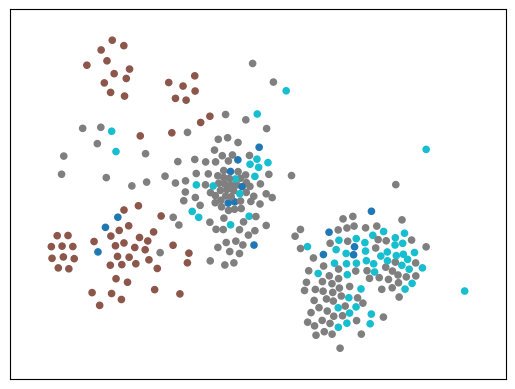

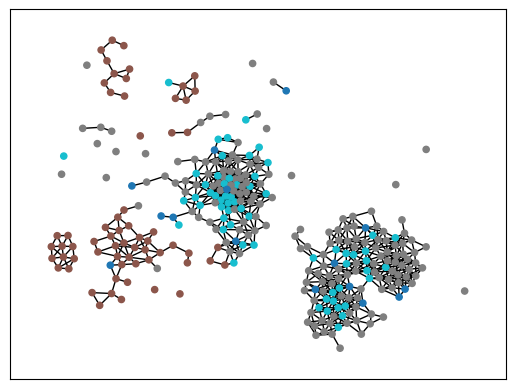

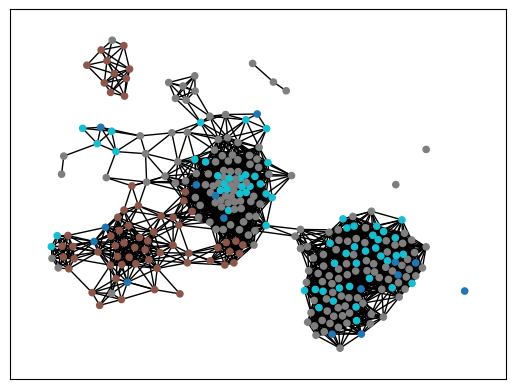

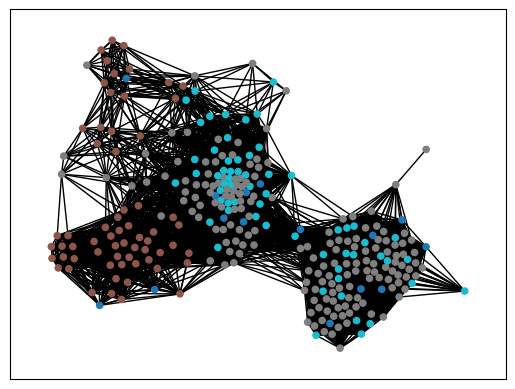

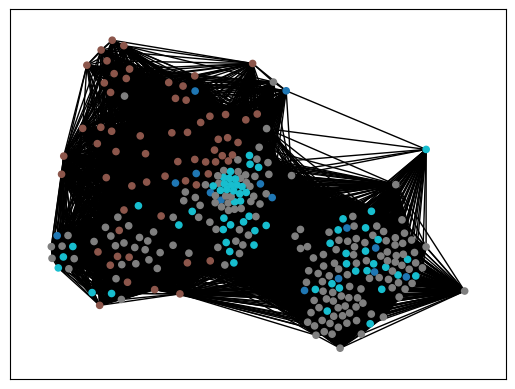

In [32]:
### Run the code below
eps_values = [0.01, 0.05, 0.1, 0.2, 0.4]

for eps in eps_values: 
    ax=plt.subplot()
    ax1=plt.subplot()
    G = nn_graph(X, eps)
    pos=nx.spring_layout(G)  
    nx.draw_networkx_edges(G,pos=X)
    nx.draw_networkx_nodes(G, pos=X, node_color=Y, node_size=20, cmap=plt.get_cmap('tab10'))
    ax.set_xlim(-0.1, 1.1)
    ax.set_ylim(-0.1, 1.1)
    plt.show()


******************
<span style="color:red">**YOUR ANSWER HERE**</span>

When epsilon increases more edges are added to the graph. Epsilon is the threshold for the distance between two nodes. When epsilon is small, the threshold is small and therefore only nodes that are close to each other are connected. When epsilon is large, the threshold is large and therefore more nodes are connected.
******************

### Task 2.1.3 (2 points)
Assign to each edge in the $\varepsilon$-neighborhood graph a weight

$$W_{i j}=e^{-\frac{\left\|\mathbf{x}_{i}-\mathbf{x}_{j}\right\|^{2}}{t}}$$

<span style='color: green'>**\[Implement\]**</span> the function ```weighted_nn_graph``` below that returns the weighted graph given the data matrix in input and the values eps and $t$, where $t$ is the parameter of the equation above. 

In [67]:
import math
def weighted_nn_graph(data, eps=20, t=0.1):
    n = len(data)
    G = nx.Graph()
    ### YOUR CODE STARTS HERE

    nodes = [node for node in range(len(data))]

    for i in nodes:
        G.add_node(i)
        for j in nodes:
            if i != j:
                if np.linalg.norm(data[i] - data[j]) < eps:
                    w = math.exp(-(np.linalg.norm(data[i]-data[j]))/t)
                    G.add_edge(i,j, weight = w)
    ### YOUR CODE ENDS HERE
    return G

print(weighted_nn_graph(X))

Graph with 307 nodes and 46971 edges


### Task 2.1.4 (2 points)

Vary $t \in \{10, 0.1, 0.000001\}$. Plot the weights as a histogram using the code below in order to analyse the results using the provided code.</br>
What happens when $t$ is very small, close to $0$, i.e., $t \rightarrow 0$?</br> What happens when $t$ is very large?
</br>Is the behaviour with $t = 0$ expected?

<span style='color: green'>**\[Motivate\]**</span> your answer reasoning on the formula. 

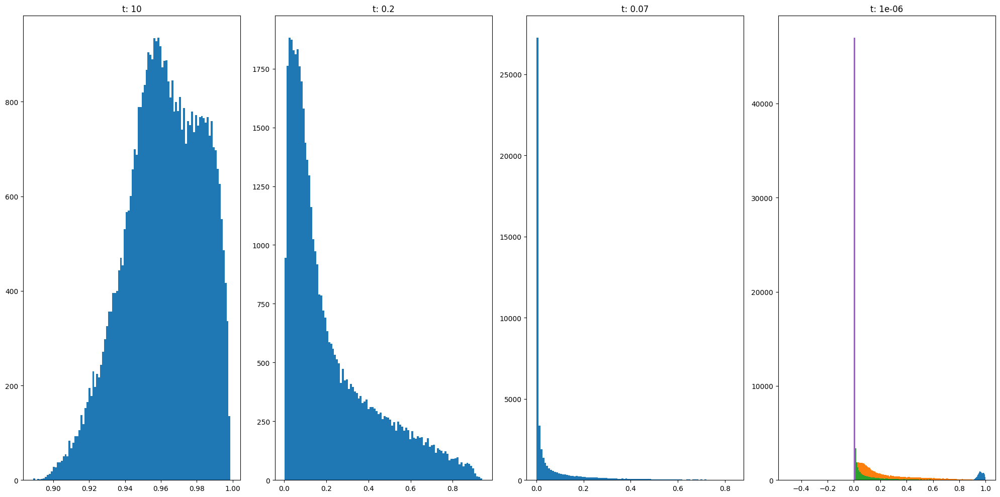

In [137]:
ts = [10, 0.2, 0.07, 0.000001]
fig, ax = plt.subplots(1,4, figsize=(20, 10))
row = 0

for i, t in enumerate(ts):
    G = weighted_nn_graph(X, eps=60, t=t)
    ys = []
    

    col = i 
    for i, d in enumerate(G.edges.data()):
        ys.append(d[2]['weight'])
    plt.hist(ys, bins=100)
    ax[col].hist(ys, bins=100)
    ax[col].set_title("t: "+str(t))
    
plt.tight_layout()

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
The plots show the distance between the nodes and the weights of the edges between them.

When t is very small, close to 0, the weights are very small. When t is very large, the weights are very large. This is expected because the weights are calculated using the formula $W_{i j}=e^{-\frac{\left\|\mathbf{x}_{i}-\mathbf{x}_{j}\right\|^{2}}{t}}$.

If we start by looking at the first graph of t=10, we can see that the weights are small. This is because the denominator is very large. and when the distance between the nodes is small, the weights become small.


When we look at the second graph of t=0.1, the weights are larger for smaller distances. This is because the denominator is greater than 0 and less than 1. When the distance goes towards 0 the exponent will go towards 0 which will result in a larger weight. When the distance between two nodes becomes larger the exponent goes towards -inf because the numerator increases which results in smaller weights when distance is increased. This is also the case for the third graph rest of the graph. Now that t is even smaller the exponent diverge towards -inf faster when distance is increased.
******************

## Task 2.2: Spectral clustering (20 points)

We will now look at spectral clustering and its properties. <br>
For this Task we will use a subgraph from [malaria_genes](https://networks.skewed.de/net/malaria_genes). <br>
Note that this dataset is the biological network of the data used in Task 2.1. <br>

### Task 2.2.1 (5 point)
Run the code below to load and visualize the network. <br> 
By only observing the below plot and the $nn$-plots (nearest-neighbor plots)of task 2.1.2, which $\varepsilon$ values seems to better approximate the real network? (just think of the answer you don't have to write something)

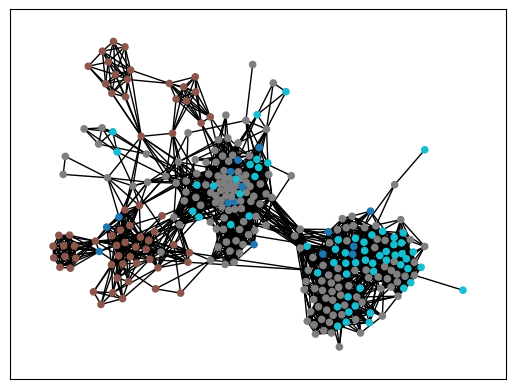

In [308]:
edgelist = read_edge_list('./data/edges.txt')
n = np.max(edgelist)+1
G = nx.Graph()
for i in range(n):
    G.add_node(i)
for edge in edgelist:
    G.add_edge(edge[0], edge[1])
pos=nx.spring_layout(G)  
nx.draw_networkx_edges(G,pos=X)
nx.draw_networkx_nodes(G, pos=X, node_color=Y, node_size=20, cmap=plt.get_cmap('tab10'))
plt.show()

Now you are having the real network, lets check how good $nn$-graph (and for which $\epsilon$ value) is a good "approximates"the real graph. <br> 

A) <span style='color: green'>**\[Implement\]**</span> a function that calculates the absolute edge difference between the real network $G$ and the one $\epsilon$-neighborhood graph. Note that in order to do that you have to follow two steps: 
1. In the first step you have to check if an edge in the real graph is also presented in the $nn$-graph, if not you increase the counter
2. In the second step you follow the opposite direction, that is you check if for every edge of the $nn$-graph if is also presented in the original one, if not you increase the counter. (Faster way just use the adjacency matrices) <br>

B) <span style='color: green'>**\[Implement\]**</span> Plot the edge-difference plot for the range of epsilon values in the range[0.01, 0.11] with step = 0.005. <br>
C) <span style='color: green'>**\[Motivate]**</span> By observing the plot it seems that there exists only one global minimum and no local minimum. Try to prove/disprove this intuition.

In [309]:
#A) YOUR CODE HERE

def edge_difference(G,eps_graph):
    counter = 0

    for edge in G.edges:
        if edge not in eps_graph.edges:
            counter += 1
    
    for edge in eps_graph.edges:
        if edge not in G.edges:
            counter += 1
    
    return counter

e_graph = nn_graph(X,0.1)
print(edge_difference(G,e_graph))



2747


(array([12]),)
0.06999999999999999


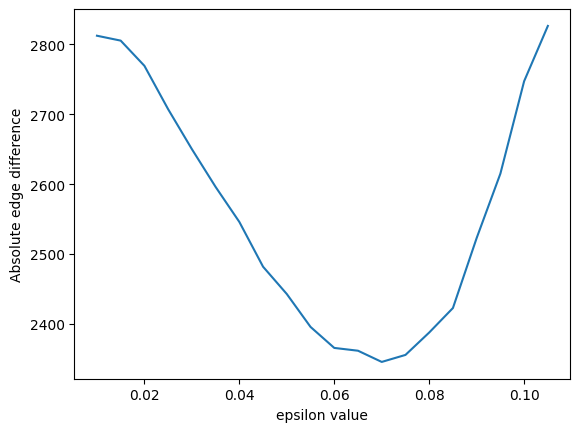

In [310]:
#B) YOUR CODE HERE
epsilon = []
difference = []

for eps in np.arange(0.01, 0.11, 0.005):
    e_graph = nn_graph(X,eps)
    epsilon.append(eps)
    difference.append(edge_difference(G,e_graph))

print(np.where(difference == np.min(difference)))
print(epsilon[12])


plt.plot(epsilon, difference)
plt.xlabel('epsilon value')
plt.ylabel('Absolute edge difference')
plt.show()

******************
<span style="color:red">**C) YOUR ANSWER HERE**</span>

By observing the plot we realize that there is only one global minimum and no local minimum. This make sense since we have a optimal value of epsilon that is the one that minimizes the edge difference. In our case $\epsilon \approx 0.07$ which we also could approximately dedeuce from the graphs in task 2.1.2 since eps=0.1 looks like the real network G the most. It makes sense that there is one global minimum because when epsilon is too small the graph does not contain enough edges to be similar to the real graph and when epsilon is too large the graph contains too many edges. Therefore, there is only one global minimum.

******************

### Task 2.2.2 (2 points)
Compute the eigenvectors and eigenvalues (using the provided function) of the Normalized Laplacian and the Random Walk Laplacian of the graph $G$.<br> 
Plot the spectrum (eigenvalues).

<span style='color: green'>**\[Implement\]**</span> the code to compute the different Laplacians. 

In [336]:
def graph_eig(L): 
    """
        Takes a graph Laplacian and returns sorted the eigenvalues and vectors.
    """
    lambdas, eigenvectors = np.linalg.eig(L)
    lambdas = np.real(lambdas)
    eigenvectors = np.real(eigenvectors)
    
    order = np.argsort(lambdas)
    lambdas = lambdas[order]
    eigenvectors = eigenvectors[:, order]
    
    return lambdas, eigenvectors

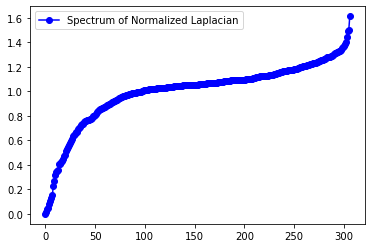

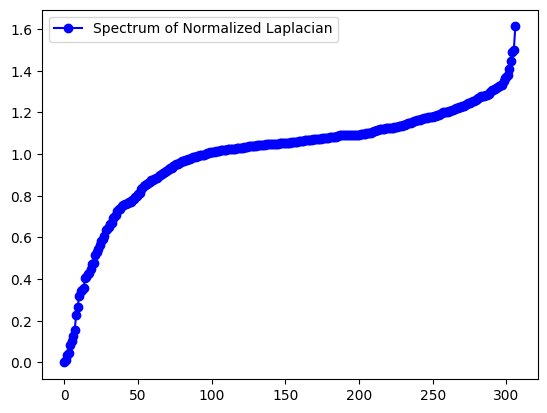

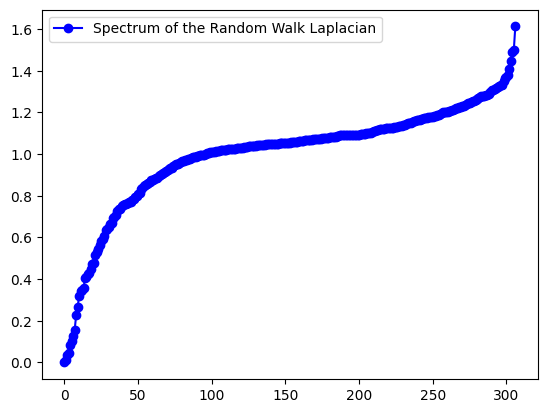

In [109]:
L_norm = None
L_rw = None

### YOUR CODE STARTS HERE

nodes = G.nodes
NumNodes = len(nodes)

# Create adjacency matrix
A = np.zeros((len(nodes), len(nodes)))
for index in G.edges:
    A[index[0],index[1]] = 1
    A[index[1],index[0]] = 1

# Create degree matrix
D = np.zeros((NumNodes, NumNodes))

for i in range(NumNodes):
    D[i,i] = np.sum(A[i,:])


identity_matrix = np.identity(len(nodes))
# Create Normalized Laplacian matrix
L_norm = identity_matrix - np.linalg.inv(D)**(1/2) @ A @ np.linalg.inv(D)**(1/2)



# Create Random Walk Laplacian matrix
L_rw = identity_matrix - np.linalg.inv(D) @ A


### YOUR CODE ENDS HERE


eigval_norm, eigvec_norm = graph_eig(L_norm)
eigval_rw, eigvec_rw = graph_eig(L_rw)

plt.figure(0)
plt.plot(eigval_norm, 'b-o', label='Spectrum of Normalized Laplacian', )
plt.legend()
plt.figure(1)
plt.plot(eigval_rw, 'b-o', label='Spectrum of the Random Walk Laplacian')
plt.legend()
plt.show()

### Task 2.2.3 (4 points)
<span style='color: green'>**\[Implement\]**</span> the function ```spect_cluster``` that returns a vector ```y_clust``` in which each entry y_clust\[i\] represents the community assigned to node $i$. The method should be able to handle both the Normalized Laplacian, and the Random Walk Laplacian. You are allowed to use your implementation from the weekly exercises and ```sklearn.cluster.k_means``` for k-means clustering. 

In [380]:
from sklearn.cluster import k_means

def spect_cluster(G, eig_type="normal", k=5, d=5):
    ### YOUR CODE STARTS HERE

    nodes = G.nodes
    NumNodes = len(nodes)
    

    # Create adjacency matrix
    A = np.zeros((len(nodes), len(nodes)))
    for index in G.edges:
        A[index[0],index[1]] = 1
        A[index[1],index[0]] = 1

    # Create degree matrix
    D = np.zeros((NumNodes, NumNodes))
    for i in range(NumNodes):
        D[i,i] = np.sum(A[i,:])
    
    identity_matrix = np.identity(len(nodes))

    if eig_type == "normal":
        L = identity_matrix - np.linalg.inv(D)**(1/2) @ A @ np.linalg.inv(D)**(1/2)
    
    if eig_type == "random":
        L = identity_matrix - np.linalg.inv(D) @ A



    l, e = graph_eig(L)
    order = np.argsort(l)
    l = l[order]
    e = e[:, order]

    sel = np.arange(len(l))[np.where(l > 1e-15)][:d]

    X_ = e[:, sel]

    best_interia = float('inf')
    y_clust = None
    for i in range(10):
        _, y_, interia, *_ = k_means(X_, k)
        if interia < best_interia: 
            y_clust = y_
            best_interia = interia

    
    ### YOUR CODE ENDS HERE
    return y_clust

#print(spect_cluster(G, eig_type="normal", k=5, d=5))

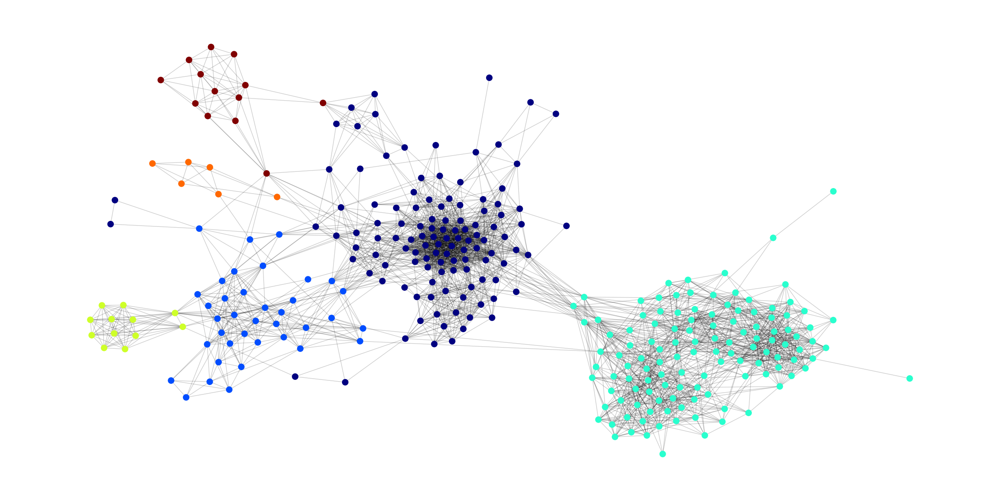

In [117]:
def plot_graph(G, clusters):
    plt.figure(1,figsize=(30,15))
    nodes = G.nodes()
    ec = nx.draw_networkx_edges(G, X, alpha=0.2)
    nc = nx.draw_networkx_nodes(G, X, nodelist=nodes, node_color=clusters, node_size=100, cmap=plt.cm.jet)

    plt.axis('off')
    plt.show()

your_clusters = spect_cluster(G, k=6)   
plot_graph(G, your_clusters)



### Task 2.2.4 (1 points)

Finally, use your implementation of spectral clustering with different Laplacians and different values of $k \in [2,7]$ and plot the results using the helper function ```plot_graph```. 

<span style='color: green'>**\[Describe\]**</span> the results you obtain. Especially, what is the difference between the Random Walk and the Normalized Laplacians, if any? How do you explain such differences? 

Method: normal, k: 2


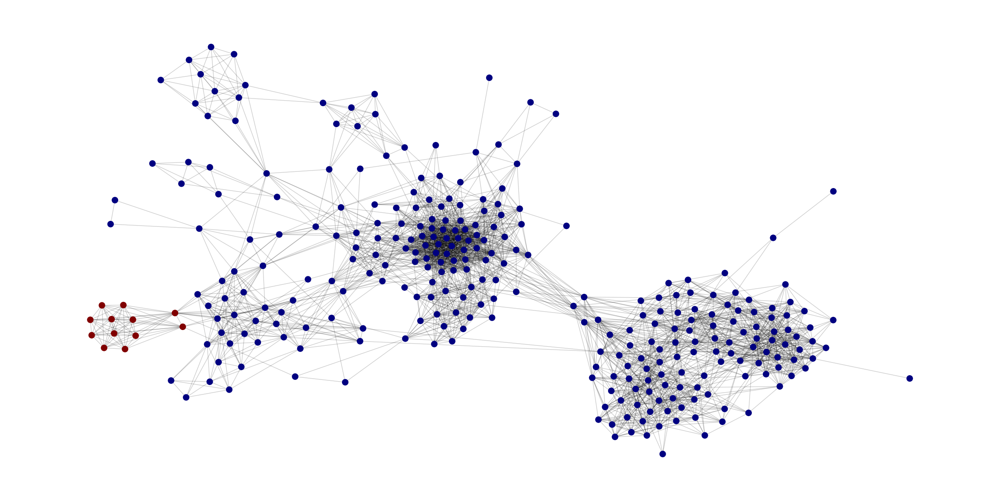

Method: normal, k: 3


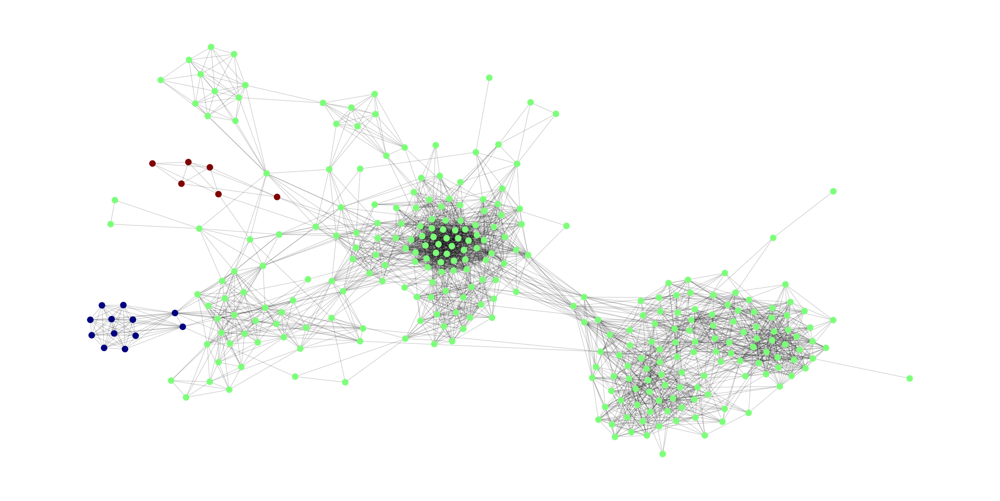

Method: normal, k: 4


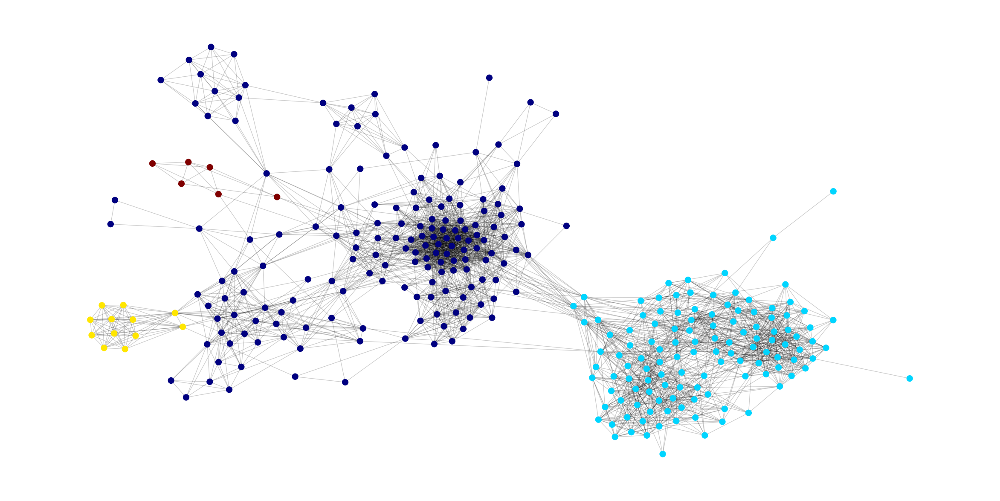

Method: normal, k: 5


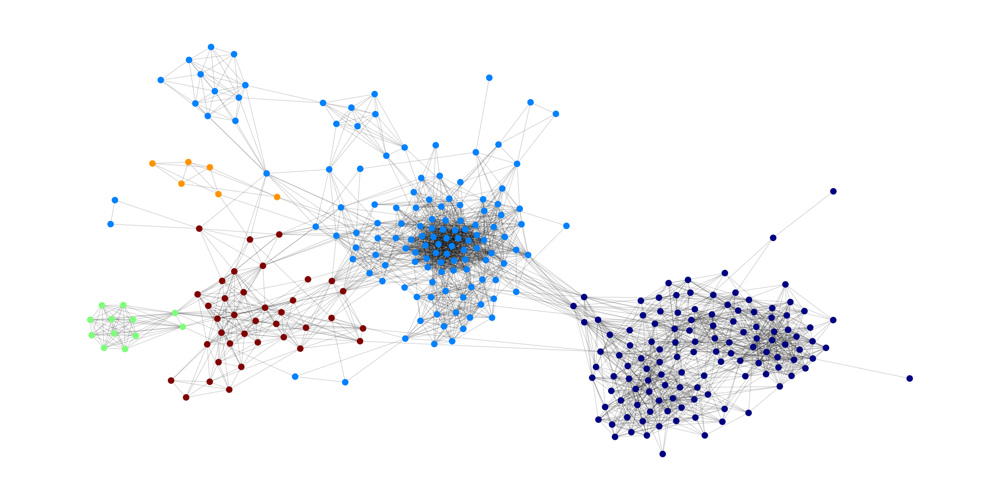

Method: normal, k: 6


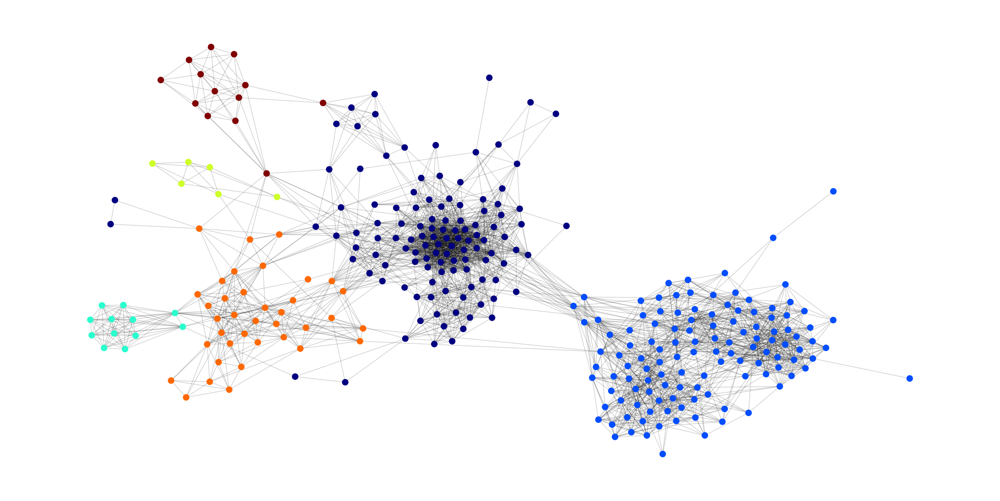

Method: normal, k: 7


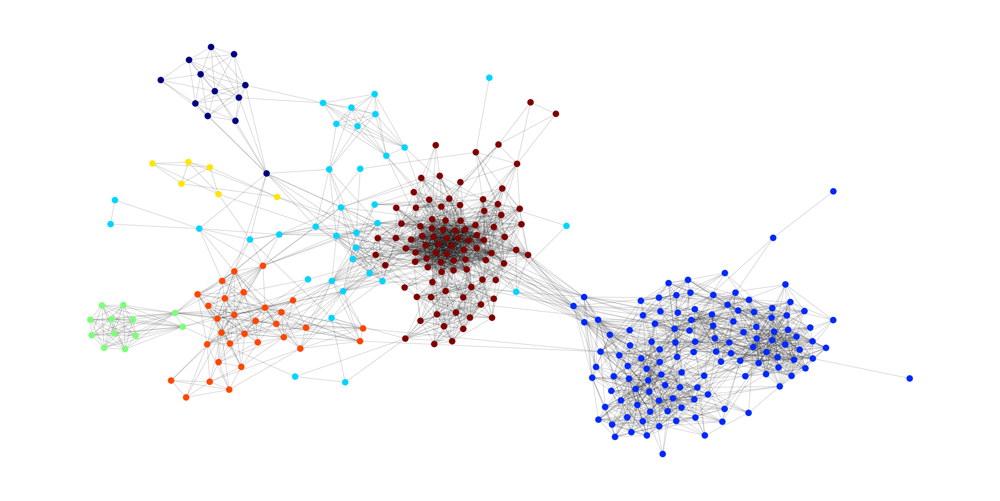

Method: random, k: 2


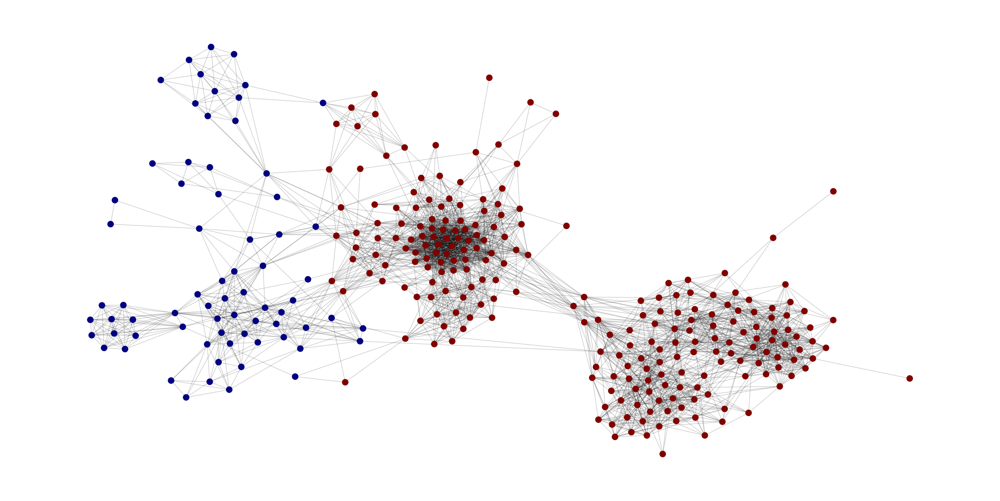

Method: random, k: 3


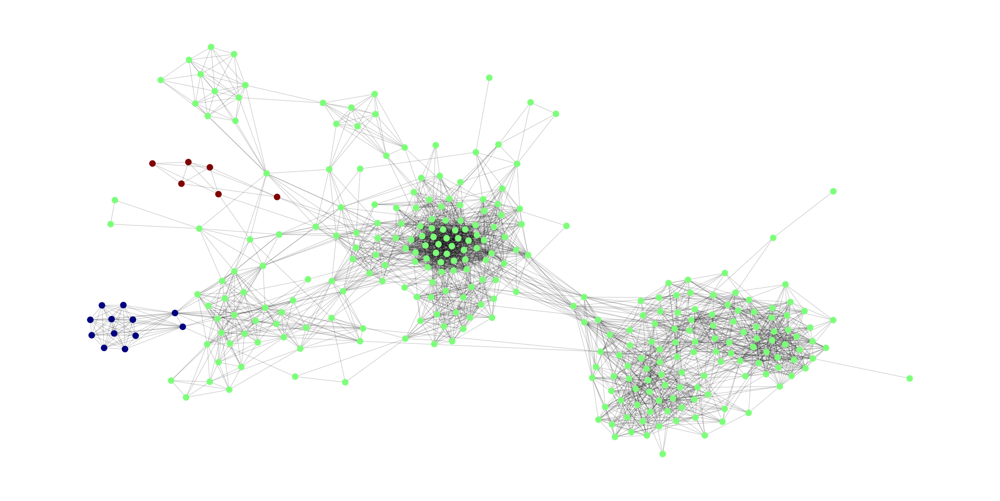

Method: random, k: 4


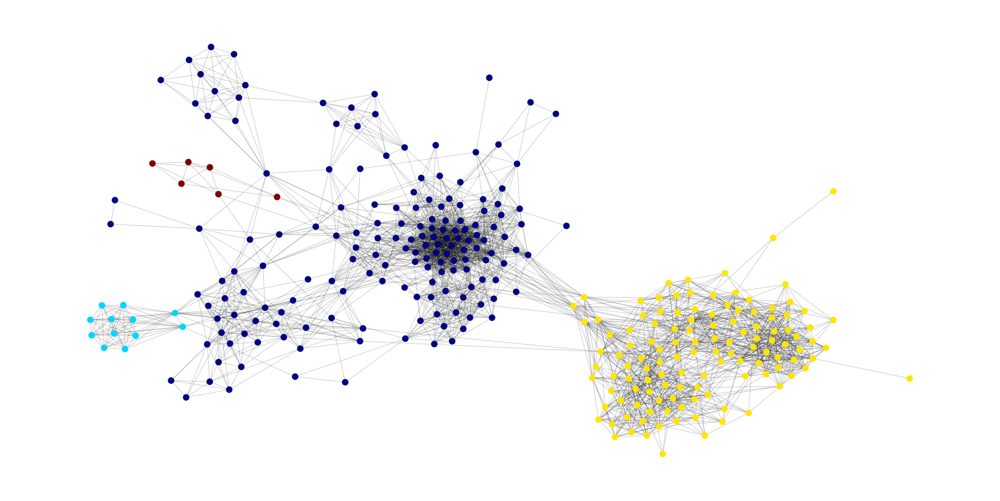

Method: random, k: 5


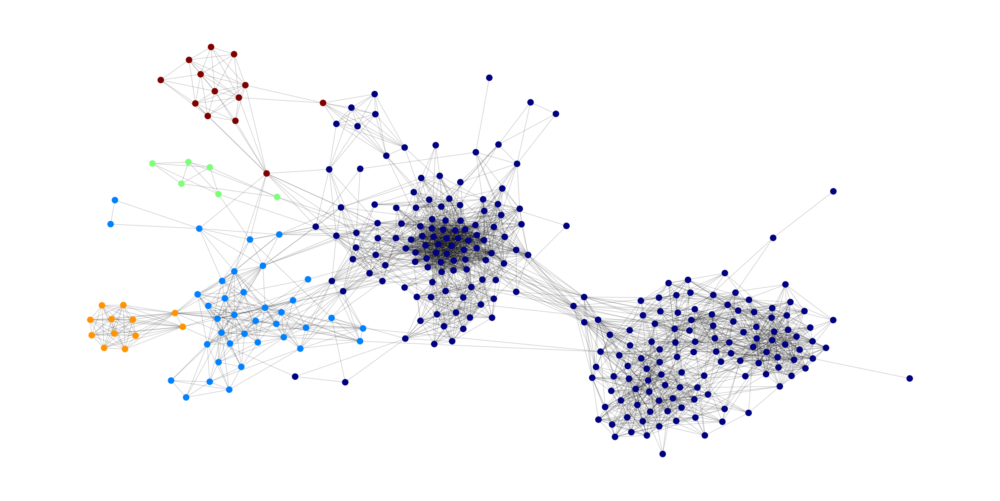

Method: random, k: 6


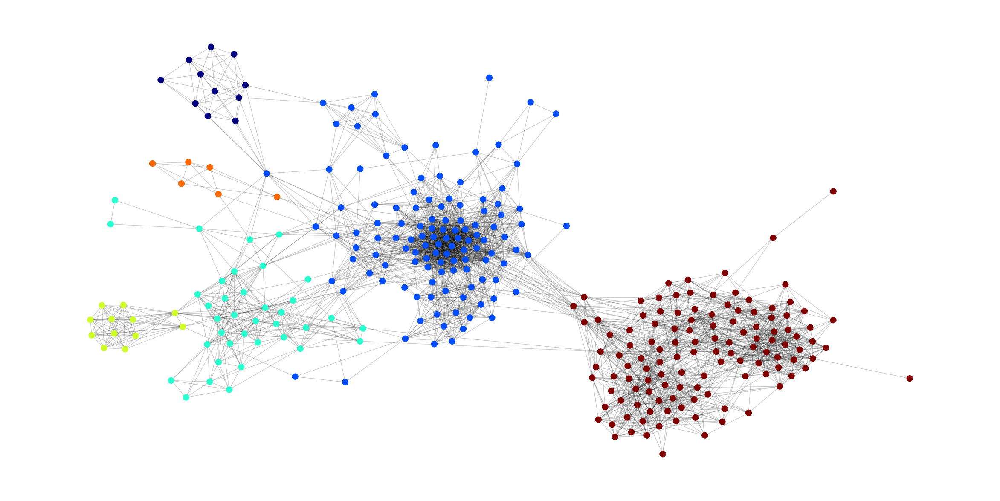

Method: random, k: 7


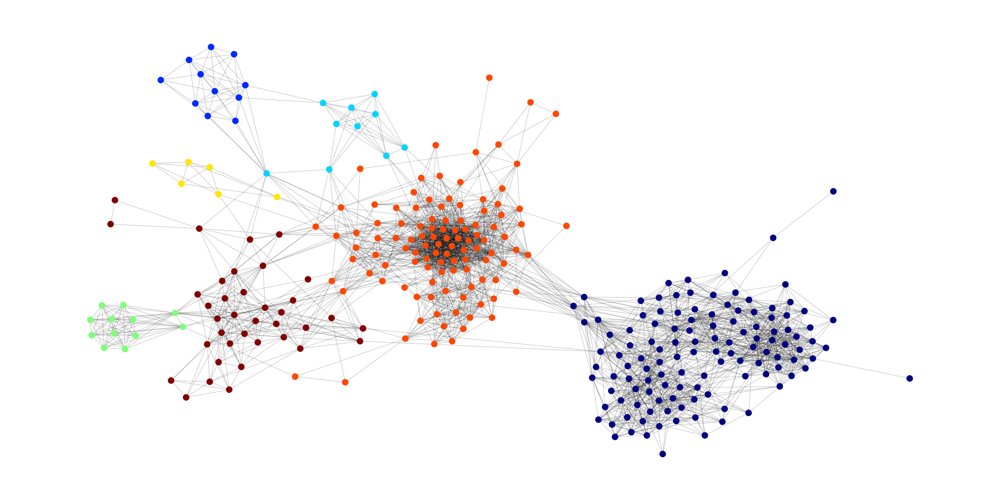

In [334]:
for method in ['normal', 'random']: 
    for k in np.arange(2,8): 
        print("Method: {}, k: {}".format(method, k))
        your_clusters = spect_cluster(G,eig_type=method, k=k)
        plot_graph(G, your_clusters)

******************
<span style="color:red">**YOUR ANSWER HERE**</span>

From the plots we can see that the random walk performs more even clustering e.g. k=5 and k=7 the normalized Laplacians seems to have few nodes lie far from the cluster. This may be due to the fact that 

?????



******************

### Task 2.2.5 (4 points)
<span style='color: green'>**\[Implement\]**</span> the modularity. Recall that the definition of modularity for a set of communities $C$ is
$$ 
Q=\frac{1}{2 m} \sum_{c \in C} \sum_{i \in c} \sum_{j \in c}\left(A_{i j}-\frac{d_{i} d_{j}}{2 m}\right) \qquad \qquad (1) 
$$
where $A$ is the adjacency matrix, and $d_i$ is the degree of node $i$

**Note**: Use ```plot_graph``` function in order to see for yourself if maximising modularity leads a better clustering. If you did not succeed with the previous Task, you are allowed to use [Scikit Learn Spectral Clustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html)

In [340]:
def modularity(G, clustering):
    modularity = 0
    ### YOUR CODE STARTS HERE
    n = len(G.nodes)
    m = len(G.edges)

    nodes = G.nodes
    NumNodes = len(nodes)

    # Create adjacency matrix
    A = np.zeros((n, n))
    for index in G.edges:
        A[index[0],index[1]] = 1
        A[index[1],index[0]] = 1

    # Create degree matrix
    D = np.zeros((NumNodes, NumNodes))
    for i in range(NumNodes):
        D[i,i] = np.sum(A[i,:])



    clusters = set(clustering)

    Q = []
    for cluster in clusters:
        nodes = np.where(clustering == cluster)[0]
        Q_i = []
        for i in nodes:
            Q_j = []
            for j in nodes:
                if j != i:
                    Q_j.append(A[i][j] - ((D[i][i]*D[j][j])/(2*m)))
            Q_i.append(sum(Q_j))

        Q.append(sum(Q_i))



    modularity = sum(Q)/(2*m)
    ### YOUR CODE ENDS HERE
    return modularity

clusters = spect_cluster(G, k=10) ### NOTE: If you do not use your implementation substitute with a call to the sklearn one. 
print(modularity(G, clusters))

[7 3 3 3 3 3 3 3 5 8 3 3 6 6 9 7 3 7 7 1 1 8 3 3 3 3 3 3 3 5 5 5 3 5 5 5 1
 7 1 7 7 7 7 1 7 1 1 1 1 1 3 5 5 5 5 5 3 7 3 3 3 3 3 3 3 3 3 3 2 0 4 4 0 0
 0 0 6 8 2 6 6 6 9 9 9 9 9 9 0 2 0 0 6 8 6 0 9 9 2 6 6 6 2 6 6 6 6 2 2 2 6
 8 6 6 0 0 0 9 9 2 2 0 2 2 0 0 6 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 6 0 0 0 0 0 0 0 0 6 6 9 2 2 9 9 2 6 0 9 9 9 9 0 2
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 9 9 9 0 0 0 9 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 6 2 8 8 8 8 8 9 4 2 9 9
 4 4 2 2 9 2 2 9 6 6 9 9 9 2 9 2 2 9 9 2 9 2 2 2 2 2 2 0 0 0 0 0 0 0 2 9 9
 9 9 9 9 9 9 9 9 9 2 9]
0.5684828559374677


### Task 2.2.6 (2 points)

Compute the modularity of your Spectral Clustering Implementation for different values of $k$. 

<span style='color: green'>**\[Motivate\]**</span> Which $k$ value maximizes the modularity? From your perspective, does spectral clustering forms "clear" clusters for the best $k$ found by modularity? Using the spectral graph theory, why do you think this is/isn't the case? 

7
0.5922033365438507


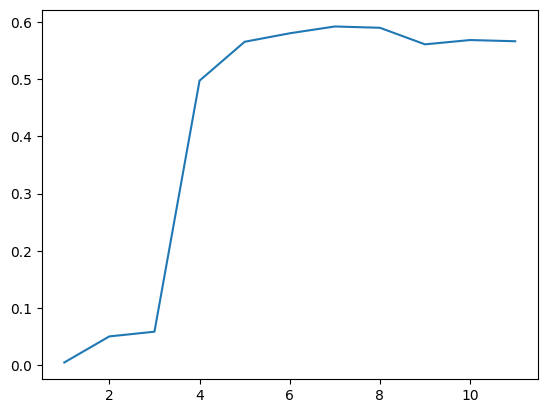

In [136]:
mods = []
ks = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
for k in ks:
    clusters = spect_cluster(G, k=k) ### NOTE: If you do not use your implementation substitute with a call to the sklearn one. 
    mods.append(modularity(G, clusters))

# You may want to use plt.plot to plot the modularity for different values of k
plt.plot(ks, mods)

print(ks[int(np.where(mods == np.max(mods))[0])])
print(mods[int(np.where(mods == np.max(mods))[0])])

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
In the graph we see that the modularity is highest when $k$ is around $7$. \\
From the spectral clustering we get a modularity of $0.592$ when $k=7$. The modularity tells us how good the clustering is and the higher the modularity the more clear the clustering is, which means that the nodes in the clusters are more connected to eachother than to the nodes in other clusters. Given a score of $0.592$ we can say that the clustering is good since the highest modularity score is $1$, which is very difficult to attain while lowest score is $-1$. 
******************

### Task 2.2.7 (2 points)

<span style='color: green'>**\[Motivate\]**</span> There seems to be a relationship between graph embeddings and spectral clustering, can you guess that? _Hint_: Think to the eigenvectors of the graph's Laplacians. (1) Check the correct box below and (2) motivate your answer.

* [x] If the embeddings are linear and the similarity is the Laplacian, the embeddings we obtain minimizing the L_2 norm are equivalent to the eigenvectors of the Laplacian. 
* [ ] If the embeddings are random-walk-based embeddings, the eigenvectors of the Random Walk Laplacian are related to the embeddings obtained by such methods. 
* [ ] The relationship is just apparent. 
* [ ] If the embeddings are linear and the similarity is the Adjacency matrix, the eigenvectors of the Laplacian are equivalent to the embeddings. 

<font color='red'>IMPORTANT: Do NOT just choose one answer. Please clarify WHY this is the correct answer.</font>

******************
<span style="color:red">**YOUR ANSWER HERE**</span>




******************

# Part 3: Link analysis
In this exercise, we will work with PageRank, Random Walks and their relationships with graph properties. 
We will use the most generic definition

$$\mathbf{r} = \alpha \mathbf{Mr} + (1-\alpha)\mathbf{p}$$

with $\mathbf{r}$ the PageRank vector, $\mathbf{M}$ the weighted transition matrix, and $\mathbf{p}$ the personalization vector. 
Additionally, let $n = |V|$, where $V$ is the nodes in the graph above.
Remember that in the case of PageRank the entries of the personalization vector are $p_i = 1/n$ for all $i$.  


## Task 3.1 Approximate PageRank (10 points)

### Task 3.1.1 (3 points)

<span style='color: green'>**\[Implement\]**</span>  a different algorithm for computing Personalized PageRank. This algorithm runs a fixed number of iterations and uses the definition of random walks. 
At each step, the algorithm either selects a random neighbor with probability $\alpha$ or returns to the starting node with probability $1-\alpha$. Every time a node is visited a counter on the node is incremented by one. Initially, each counter is 0. The final ppr value is the values in the nodes divided by the number of iterations. 

In [286]:
import random as rd

def approx_personalized_pagerank(G, node, alpha = 0.85, iterations = 1000): 


    # Get number of nodes
    n = G.number_of_nodes()

    # Initialize the pagerank vector
    ppr = np.zeros(n)

    # Set current node to starting node
    curr_node = node

    # Update visited nodes
    ppr[curr_node] += 1

    # Start the Iterations
    for i in range(1,iterations):
        
        # Get the probability of teleporting
        if rd.random() > alpha:
            # Here we do teleport and so we return to the starting node and increase the rank of that node by 1
            curr_node = node
            ppr[curr_node] += 1
        else:
            # Here we do not teleport and so we move to one of its neighbors at random. If the current node had no neighbors, we stay at the current node
            # We also increase the rank of that node by 1

            # Get the neighbors of the current node
            neighbors = list(G.neighbors(curr_node))

            # See if there are any neighbors to move to, else stay
            if len(neighbors) == 0:
                neighbors = [curr_node] # Stay

            # Choose a random neighbor
            curr_node = rd.choice(neighbors)

            ppr[curr_node] += 1   
    
    ### YOUR CODE ENDS HERE
    return ppr/iterations

### Task 3.1.2 (3 points)

Run the ```approx_personalized_pagerank``` with default $\alpha$ and iterations $\{10, n, 2n, 4n, 100n, 1000n\}$ where $n$ is the number of nodes in the graph and starting node the node with the highest PageRank computed in Task 3.1.2.

<span style='color: green'>**\[Motivate\]**</span> what you notice as the number of iterations increase. Why are the values and the top-10 nodes ranked by PPR changing so much? 

In [232]:
edgelist = read_edge_list('./data/edges.txt')
n = np.max(edgelist)+1
G = nx.Graph()
for i in range(n):
    G.add_node(i)
for edge in edgelist:
    G.add_edge(edge[0], edge[1])
starting_node = np.argmax(nx.pagerank(G))
for i, iterations in enumerate([10, G.number_of_nodes(), G.number_of_nodes()*2, G.number_of_nodes()*4, G.number_of_nodes()*100, G.number_of_nodes()*1000]):
    r = approx_personalized_pagerank(G, starting_node, iterations = iterations)
    r[starting_node] = 0
    r_sorted = np.argsort(r)[::-1]
    r_values = np.sort(r)[::-1]
    print(f'Iteration {iterations}: top-10 r={r_sorted[:10]}\n top-10 values={r_values[:10]}\n')

import operator
rr = nx.pagerank(G, alpha=0.85, personalization = {starting_node: 1})
rr[starting_node] = 0
r=np.zeros(len(rr))
for k in rr: r[k] = rr[k]
r_sorted = np.argsort(r)[::-1]
r_values = np.sort(r)[::-1]
print(f'top-10 r={r_sorted[:10]}\n top-10 values={r_values[:10]}\n')

Iteration 10: top-10 r=[ 41  18  39  57  44 104  99 100 101 102]
 top-10 values=[0.2 0.2 0.1 0.1 0.1 0.  0.  0.  0.  0. ]

Iteration 307: top-10 r=[41 18 39 42 40 15 36 44 57 17]
 top-10 values=[0.08794788 0.08143322 0.07491857 0.06188925 0.05863192 0.05537459
 0.05537459 0.04885993 0.04234528 0.02931596]

Iteration 614: top-10 r=[41 39 40 18 42 44 36 15 57 17]
 top-10 values=[0.08794788 0.06840391 0.06677524 0.06677524 0.06188925 0.05374593
 0.05374593 0.04397394 0.03583062 0.03257329]

Iteration 1228: top-10 r=[41 39 18 40 42 36 15 57 44 17]
 top-10 values=[0.08143322 0.07166124 0.06514658 0.06270358 0.05618893 0.0529316
 0.04967427 0.04315961 0.04153094 0.03501629]

Iteration 30700: top-10 r=[39 41 40 18 15 42 36 44 57 17]
 top-10 values=[0.07013029 0.06928339 0.06824104 0.06286645 0.05684039 0.05351792
 0.04957655 0.04394137 0.04052117 0.03390879]

Iteration 307000: top-10 r=[39 41 40 18 15 42 36 44 57 37]
 top-10 values=[0.07346254 0.06818893 0.06791205 0.06330945 0.05809772 0.056

******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

### Task 3.1.3 (2 points)

Compare the 5 nodes with the highest PPR obtained from ```nx.pagerank(G, alpha=0.85, personalization={node_highest_pagerank: 1})``` and the one obtained by the approximation. 

<span style='color: green'>**\[Describe\]**</span> the differences. Does the number of iterations affect the results? Is there a relationship between the number of iterations and the results? Is there a relationship between the approximated value of PageRank and the real value? Do you notice anything as the number of iteration increases? 

In [233]:
k = 5
ppr_nx = nx.pagerank(G, alpha=0.85, personalization = {starting_node: 1})
r_nx = [0 for _ in range(G.number_of_nodes())]
for k, v in ppr_nx.items():
    r_nx[k] = v
r_est = approx_personalized_pagerank(G, starting_node, alpha=0.85)

topk_nx = np.argsort(r_nx)[-5:]
topk_est = np.argsort(r_est)[-5:]

print(topk_nx, topk_est)

for iterations in [10, G.number_of_nodes(), G.number_of_nodes()*2, G.number_of_nodes()*4, G.number_of_nodes()*100, G.number_of_nodes()*1000]:
    print(f'Number of iterations {iterations}')
    ppr_nx = nx.pagerank(G, alpha=0.85, personalization = {starting_node: 1})
    r_nx = [0 for _ in range(G.number_of_nodes())]
    for k, v in ppr_nx.items():
        r_nx[k] = v
    r_est = approx_personalized_pagerank(G, starting_node, iterations = iterations, alpha=0.85)
    print(f'Approximate PPR: {r_est[:10]}')
    print(f'Real PPR: {r_nx[:10]}')
    
    
    topk_nx = np.argsort(r_nx)[-5:]
    topk_est = np.argsort(r_est)[-5:]

    print(f"Topk of nx.pagerank: {topk_nx}, Topk of our estimation {topk_est}, Size of intersection: {len(set(topk_nx).intersection(set(topk_est)))}")

[18 41 40 39  0] [18 40 39 41  0]
Number of iterations 10
Approximate PPR: [0.3 0.  0.  0.  0.  0.  0.  0.  0.  0. ]
Real PPR: [0.20102640550640022, 0.0004761511237216732, 0.001421044532107968, 0.00517928011352294, 0.0010162923813859888, 0.0006924636204434976, 0.000586579792176299, 0.000586579792176299, 0.0003234474438257967, 0.00019090839324436927]
Topk of nx.pagerank: [18 41 40 39  0], Topk of our estimation [57 44 18 41  0], Size of intersection: 3
Number of iterations 307
Approximate PPR: [0.23452769 0.         0.00325733 0.00651466 0.         0.
 0.         0.         0.         0.        ]
Real PPR: [0.20102640550640022, 0.0004761511237216732, 0.001421044532107968, 0.00517928011352294, 0.0010162923813859888, 0.0006924636204434976, 0.000586579792176299, 0.000586579792176299, 0.0003234474438257967, 0.00019090839324436927]
Topk of nx.pagerank: [18 41 40 39  0], Topk of our estimation [42 39 18 41  0], Size of intersection: 4
Number of iterations 614
Approximate PPR: [0.20521173 0.  

*****************
<span style="color:red">**YOUR ANSWER HERE**</span>
*****************

### Task 3.1.4 (2 points)

Run again the same experiment but this time use $\alpha = 0.1$. 

<span style='color: green'>**\[Motivate\]**</span> Motivate whether and why you need more or less iterations to predict the 5 nodes with the highest PPR.

In [238]:
for iterations in [10, G.number_of_nodes(), G.number_of_nodes()*2, G.number_of_nodes()*4, G.number_of_nodes()*100]:
    ppr_nx = nx.pagerank(G, alpha=0.1, personalization = {starting_node: 1})
    r_nx = [0 for _ in range(G.number_of_nodes())]
    for k, v in ppr_nx.items():
        r_nx[k] = v
    r_est = approx_personalized_pagerank(G, starting_node, iterations = iterations, alpha=0.1)

    topk_nx = np.argsort(r_nx)[-5:]
    topk_est = np.argsort(r_est)[-5:]

    print(f"Topk of nx.pagerank: {topk_nx}, Topk of our estimation {topk_est}, Size of intersection: {len(set(topk_nx).intersection(set(topk_est)))}")
    

Topk of nx.pagerank: [40 41 42 39  0], Topk of our estimation [81 80 18 36  0], Size of intersection: 1
Topk of nx.pagerank: [40 41 42 39  0], Topk of our estimation [41 42 44 57  0], Size of intersection: 3
Topk of nx.pagerank: [40 41 42 39  0], Topk of our estimation [36 42 57 15  0], Size of intersection: 2
Topk of nx.pagerank: [40 41 42 39  0], Topk of our estimation [42 39 57 15  0], Size of intersection: 3
Topk of nx.pagerank: [40 41 42 39  0], Topk of our estimation [15 39 41 36  0], Size of intersection: 3


*****************
<span style="color:red">**YOUR ANSWER HERE**</span>
*****************

## Task 3.2 Spam and link farms (12 points)

We will now study the effect of spam in the network and construct a link farm. In this part, if you want to modify the graph, use a copy of the original graph every time you run your code, so that you do not keep adding modifications.

In [149]:
edgelist = read_edge_list('./data/edges.txt')
n = np.max(edgelist)+1
G2 = nx.Graph()
for i in range(n):
    G2.add_node(i)
for edge in edgelist:
    G2.add_edge(edge[0], edge[1])
G = G2.copy()

### Task 3.2.1 (3 points)
Based on the analysis in the slides, construct a spam farm $s$ on the graph $G$ with $T$ fake nodes. Assume that $s$ manages to get links from node 1. With $\alpha=0.5$, 

<span style='color: green'>**\[Describe\]**</span> which is the minimum number of pages $T$ that we you need to add in order to get $s$ being assigned the highest PageRank?

In [184]:
#CODE HERE IF YOU NEED THAT

def spamfarm(G, alpha):
    starting_node = np.argmax(nx.pagerank(G))
    n = np.max(edgelist)+1
    ppr = nx.pagerank(G, alpha=0.5, personalization = {starting_node: (starting_node + 1)})

    pX = ppr[1]
    max_ppr = max(ppr.values())

    T=0
    ps = pX/(1-alpha**2)

    while ps < max_ppr:
        T += 1
        ps = pX/(1-alpha**2) + alpha/(1+alpha)*T/n


    return f"Number of fake nodes added {T}, with pagerank of {ps}"


print(spamfarm(G, 0.5))



Number of fake nodes added 483, with pagerank of 0.524448936087188


******************
<span style="color:red">**YOUR ANSWER HERE**</span>
We use the formula below to calculate the number of pages T needed to get the highest PageRank.
Let be $p_s$ the PageRank of the page $s$ and $p_X$ the PageRank of the "honest" pages that link to $s$. 
The PageRank $p_s$ is the sum of the contribution of the honest pages $p_X$ and the fake pages
$$
\begin{aligned}
p_s & =\frac{p_X}{1-\alpha^2}+\frac{\alpha}{1+\alpha} \frac{T}{n}
\end{aligned}
$$

From our calculations we have to set T=483 to get the highest PageRank for the spam farm.
******************

### Task 3.2.2 (3 points)
In the above scenario, assume that $T = \frac{1}{5}$ of the nodes in the original graph. 

<span style='color: green'>**\[Motivate\]**</span> what value of $\alpha$ will maximize the PageRank $\mathbf{r}_s$ of the link farm $s$. Provide sufficient justification for your choice.

******************
<span style="color:red">**YOUR ANSWER HERE**</span>

From the plot below we notice that the pagerank of the linkfarm increases as $\alpha$ goes towards 1. This make sense given the formula of the pagerank for the linkfarm. When alpha is 0 the pagerank of the linkfarm depends only on thhe pagerank of the honest pages that links to the linkfarm. When alpha increases the pagerank of the linkfarm depends more on the number of fake pages and fraction of the contribution from the honest pages. When alpha is 1 the pagerank of the linkfarm becomes $\frac{1}{2}\frac{T}{n}$.








******************

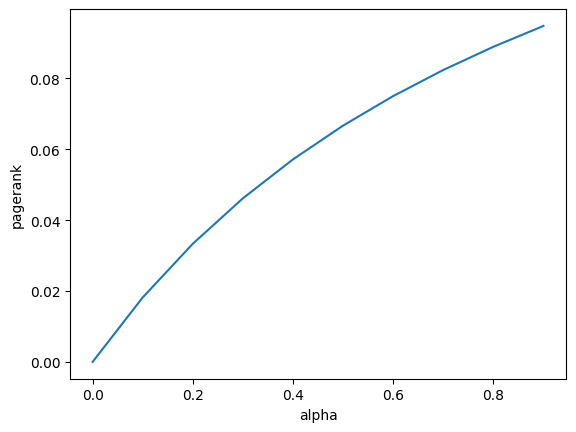

In [209]:
starting_node = np.argmax(nx.pagerank(G))
n = np.max(edgelist)+1
ppr = nx.pagerank(G, alpha=0.5, personalization = {starting_node: (starting_node + 1)})

pX = ppr[1]
T=n/5


pagerank_val = []

for alpha in np.arange(0,1,0.1):
    ps = pX/(1-alpha**2) + alpha/(1+alpha)*T/n
    pagerank_val.append(ps)


plt.plot(np.arange(0,1,0.1), pagerank_val)
plt.xlabel('alpha')
plt.ylabel('pagerank')
plt.show()




### Task 3.2.3 (3 points)

Now we fix both $\alpha = 0.5$ and $T = \frac{1}{5}n$. 

<span style='color: green'>**\[Implement\]**</span>  ```trusted_pagerank``` the method for spam mass estimation.

In [312]:

def trusted_pagerank(G, trusted_indices, iterations=500, alpha=0.5):
    r = None 
    # Get number of nodes
    n = G.number_of_nodes()

    # Initialize the pagerank vector
    tr = np.zeros(n)

    #Define the starting node as the node with the highest pagerank
    node = np.argmax(nx.pagerank(G, alpha=alpha, personalization={starting_node:1}).values())
    
    # Set current node to starting node
    curr_node = node

    # Update visited nodes
    tr[curr_node] += 1

    # Start the Iterations
    for _ in range(1,iterations):
        
        # Get the probability of teleporting
        if rd.random() > alpha:
            # Here we do teleport and so we return to the starting node and increase the rank of that node by 1
            curr_node = rd.choice(trusted_indices)
            tr[curr_node] += 1
        else:
            # Here we do not teleport and so we move to one of its neighbors at random. If the current node had no neighbors, we stay at the current node
            # We also increase the rank of that node by 1

            # Get the neighbors of the current node
            neighbors = list(G.neighbors(curr_node))

            # See if there are any neighbors to move to, else stay
            if len(neighbors) == 0:
                neighbors = [curr_node] # Stay

            # Choose a random neighbor
            curr_node = rd.choice(neighbors)

            tr[curr_node] += 1   
    
    page_ranks = [i for i in nx.pagerank(G, alpha=alpha, personalization={starting_node:1}).values()]
    trust_ranks = tr/iterations
    #person_ppr = approx_personalized_pagerank(G, node, iterations=iterations, alpha=alpha)


    r = (page_ranks - trust_ranks)/page_ranks


    return r


print(trusted_pagerank(G, [1,2,3,4,5], iterations=500, alpha=0.5))



[ 9.96184436e-01 -8.71513120e+03 -1.13786990e+03 -7.17492816e+01
 -1.07157879e+03 -4.00940504e+03 -2.92151797e+02 -7.22879494e+01
  1.00000000e+00 -5.28215469e+02 -3.39277594e+02 -1.51463212e+03
  1.00000000e+00  1.00000000e+00  1.00000000e+00  1.00000000e+00
 -1.14615797e+02  1.00000000e+00  1.00000000e+00  1.00000000e+00
  1.00000000e+00  1.00000000e+00 -1.28081690e+03 -2.04990704e+03
 -1.22892662e+02 -2.61672356e+02 -3.30973380e+02 -3.10776792e+01
 -2.08212349e+02 -4.48759786e+02  1.00000000e+00 -1.54936909e+02
 -3.98746618e+02 -4.48759786e+02  1.00000000e+00 -4.48759786e+02
  9.53490861e-01  1.00000000e+00  1.00000000e+00  9.62355133e-01
  1.00000000e+00  1.00000000e+00  1.00000000e+00  1.00000000e+00
  9.50545748e-01  1.00000000e+00  1.00000000e+00  1.00000000e+00
  1.00000000e+00  1.00000000e+00 -3.77908029e+02  1.00000000e+00
  1.00000000e+00  1.00000000e+00  1.00000000e+00 -4.48759786e+02
 -2.88843674e+01  9.49979619e-01 -1.58398706e+02 -1.41174284e+02
 -9.14926376e+01 -2.10190

### Task 3.2.4 (3 points)

<span style='color: green'>**\[Motivate\]**</span> whether we are able to detect the node $s$, if the trusted set of nodes is a random sample $10\%$ of the nodes in the original graph. 
If not, what could be a viable solution? Which nodes would you rather choose as trusted?

You are not obliged to, but you can write some helper code to reach the answer faster.  

_Hint_: Remember the spam mass formula in the Link Analysis lecture

In [ ]:
### YOUR CODE HERE




*******************
<span style="color:red">**YOUR ANSWER HERE**</span>
******************

# Part 4: Graph embeddings (19 points)
In this final part, we will try a different approach for clustering the data from above. 
The strategy is going to be the following:

1. Use VERSE [[1]](https://arxiv.org/pdf/1803.04742.pdf) to produce embeddings of the nodes in the graph.
2. Use K-Means to cluster the embeddings. Measure and report NMI for the clustering. 

[[1](https://arxiv.org/pdf/1803.04742.pdf)] Tsitsulin, A., Mottin, D., Karras, P. and Müller, E., 2018, April. Verse: Versatile graph embeddings from similarity measures. In Proceedings of the 2018 World Wide Web Conference (pp. 539-548).

In [374]:
G = email.S_dir.copy()

## Task 4.1.1 (6 points)

<span style='color: green'>**\[Implement\]**</span> the methods below to compute sampling version of VERSE. _Hint:_ it might be a help to look in the original article \[1\] above.

In [367]:
def sigmoid(x):
    ''' Return the sigmoid function of x 
        x: the input vector
    '''
    ### YOUR CODE STARTS HERE

    x = 1 / ( 1 + np.exp(-x))

    ### YOUR CODE ENDS HERE
    return x

def pagerank_matrix(G, alpha = 0.85) :     
    ''' Return the Personalized PageRank matrix of a graph

        Args:
            G: the input graph
            alpha: the dumping factor of  PageRank

        :return The nxn PageRank matrix P
    '''
    ### YOUR CODE STARTS HERE

    # Get number of nodes
    n = G.number_of_nodes()

    # Get Adjacency matrix
    A = nx.to_numpy_array(G)

    # Get the inverse square root of the degree matrix
    D = np.diag(np.sum(A, axis=0))
    D_inv_sqrt = np.linalg.inv(np.sqrt(D))

    # Now we can get the normalized adjacency matrix
    A_hat = D_inv_sqrt @ A @ D_inv_sqrt

    # # Initialize the PageRank
    s = np.array(list(nx.pagerank(G, alpha=alpha).values()))

    
    # Initialize the Personalized PageRank vector
    pi_s = np.ones(n) / n
    
    update = True

    # Start recursive update for the Personalized PageRank vector
    while update:
        pi_s_new = alpha * s + (1 - alpha) * pi_s @ A_hat
        update = np.linalg.norm(pi_s_new - pi_s) > 1e-16
        pi_s = pi_s_new
    
    # Return the Personalized PageRank matrix
    P = pi_s/np.sum(pi_s)
    
    ### YOUR CODE ENDS HERE
    return P
    

def update(u, v, Z, C, step_size) :
    '''Update the matrix Z using row-wise gradients of the loss function

       Args:
            u : the first node
            v : the second node
            Z : the embedding matrix
            C : the classification variable used in Noise Contrastive estimation indicating whether the sample is positive or negative
            step_size: step size for gradient descent


       :return nothing, just update rows Z[v,:] and and Z[u,:] 
       
       ****(if we don't return anything, then we need to use the keyword global to modify the variable Z
       Therefore, it is much simpler to just return the updated Z)****
    '''
    ### YOUR CODE STARTS HERE

    # Get the sigmoid of the dot product of the two nodes
    sigma = sigmoid(Z[u].dot(Z[v]))

    # Compute the gradient
    grad = (C - sigma) * step_size

    # Update the embedding matrix
    Z[u] += grad * Z[v]
    Z[v] += grad * Z[u]

    ### YOUR CODE ENDS HERE

    return Z
    
    
def verse(G, S, d, k = 3, step_size = 0.0025, steps = 10000): 
    ''' Return the sampled version of VERSE

        Args:
            G: the input Graph
            S: the PageRank similarity matrix
            d: dimension of the embedding space
            k: number of negative samples
            step_size: step size for gradient descent
            steps: number of iterations

        :return the embedding matrix nxd
    '''
    n = G.number_of_nodes()
    Z = 1/d*np.random.rand(n,d)

    ### YOUR CODE STARTS HERE

    # Start the recursive update
    for _ in range(steps):

        # Pick the positive sample
        u = np.random.choice(n, p=S)

        # Pick the similar node
        v_pos = random.choice(list(G.neighbors(u)))

        # Pick the k negative samples
        v_neg = np.random.choice(n, size=k, replace=False, p=S)

        # Update the embedding matrix with the positive sample
        Z = update(u, v_pos, Z, C = 1, step_size = step_size)

        # Update the embedding matrix with all the negative samples
        for v_hat in v_neg:
            Z = update(u, v_hat, Z, C = 0, step_size = step_size)

    ### YOUR CODE ENDS HERE
    return Z

In [376]:
# This code runs the `verse` algorithm above on G and stores the embeddings to 'verse.npy'
P   = pagerank_matrix(G)
print(P)
emb = verse(G, P, 128, step_size=0.0025, steps=10_000)
np.save('verse.npy', emb)


print(emb)

[0.00940259 0.00795675 0.01535865 0.00867433 0.00419036 0.01083417
 0.01008273 0.0025657  0.00610233 0.01020331 0.00547666 0.01646164
 0.00528345 0.00504096 0.00709465 0.01013191 0.00723965 0.00990944
 0.0078663  0.0044113  0.00493897 0.00666597 0.00801541 0.00485016
 0.00892538 0.01060408 0.01119535 0.01133755 0.00676878 0.00688629
 0.01410011 0.005255   0.0132394  0.01332953 0.00503112 0.00378692
 0.00976845 0.01143522 0.00826114 0.0034495  0.00645979 0.00847706
 0.00281521 0.00444945 0.00584596 0.00807696 0.00518233 0.01505859
 0.00911384 0.00555492 0.00429655 0.00658147 0.00562023 0.00483573
 0.01065374 0.00685075 0.00808654 0.0062387  0.00550006 0.00937406
 0.00213795 0.0080464  0.00693986 0.00920726 0.01194052 0.01088208
 0.00489504 0.00879622 0.01117902 0.01793884 0.00650774 0.0127851
 0.00814107 0.0069994  0.0023983  0.00239792 0.00433892 0.00621628
 0.00302129 0.0083798  0.00620239 0.00860904 0.01051556 0.00582437
 0.00540056 0.0118702  0.00790352 0.00791476 0.00492069 0.00856

### Task 4.1.2 (3 points)

<span style='color: green'>**\[Implement\]**</span> a small piece of code that runs $k$-means on the embeddings with $k \in [2,7]$ to evaluate the performance compared to Spectral clustering using the NMI as measure. You can use ```sklearn.metrics.normalized_mutual_info_score``` for the NMI and ```sklearn.cluster.KMeans``` for kmeans. In both cases, you can use your own implementation from Handin 1 or the exercises, but it will not give you extra points.  

<span style='color: green'>**\[Describe\]**</span> which of the method performs the best and whether the results show similarities between the two methods

In [395]:
### YOUR CODE STARTS HERE
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import normalized_mutual_info_score


true_labels = email.communities


for k in range(2, 8):
    print("number of clusters k={k}".format(k=k))
    # Initialize the KMeans model
    kmeans = KMeans(n_clusters=k).fit(emb)
    k_labels = kmeans.labels_
    print(f"Kmeans: {normalized_mutual_info_score(k_labels, true_labels)}")

    # Initialize the Spectral Clustering model from sklearn
    spectral_clust = SpectralClustering(n_clusters=k).fit(emb)
    spec_labels = spectral_clust.labels_
    print(f"SKLEARN - Spectralclustering: {normalized_mutual_info_score(spec_labels, true_labels)}")

    #Our own spectral clustering
    spectral_clust = spect_cluster(G, k=k)
    print(f"Spectralclustering: {normalized_mutual_info_score(spectral_clust, true_labels)}")

    print()

from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import normalized_mutual_info_score

true_labels = email.communities

# run k-means and spectral clustering for different values of k
k_values = range(2, 8)
for k in k_values:
    # k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=123).fit(emb)
    kmeans_labels = kmeans.labels_

    # spectral clustering
    spectral = SpectralClustering(n_clusters=k, random_state=123).fit(emb)
    spectral_labels = spectral.labels_

    # compute NMI score
    kmeans_nmi = normalized_mutual_info_score(labels_true=true_labels, labels_pred=kmeans_labels)
    spectral_nmi = normalized_mutual_info_score(labels_true=true_labels, labels_pred=spectral_labels)

    diff = kmeans_nmi - spectral_nmi

    print(f"k={k}: K-means NMI={kmeans_nmi:.3f}, Spectral NMI={spectral_nmi:.3f}, K-means - Spectralclustering NMI: {diff:.3f}")

### YOUR CODE ENDS HERE

number of clusters k=2
Kmeans: 0.05557952553143267
SKLEARN - Spectralclustering: 0.05552140225829352
Spectralclustering: 0.3557732597953929

number of clusters k=3
Kmeans: 0.04660855060217356
SKLEARN - Spectralclustering: 0.04807950991068122
Spectralclustering: 0.4504341078713929

number of clusters k=4
Kmeans: 0.028538340827695175
SKLEARN - Spectralclustering: 0.06836586333193514
Spectralclustering: 0.45181889733598474

number of clusters k=5
Kmeans: 0.047347490189421935
SKLEARN - Spectralclustering: 0.07754396515584261
Spectralclustering: 0.6663841172688136

number of clusters k=6
Kmeans: 0.07753403677542761
SKLEARN - Spectralclustering: 0.06267282768253254
Spectralclustering: 0.8189682563924197

number of clusters k=7
Kmeans: 0.07711417948228066
SKLEARN - Spectralclustering: 0.09997795959746039
Spectralclustering: 0.7395144349316444



*******************
<span style="color:red">**YOUR ANSWER HERE**</span>

The NMI masure is a measure of the similarity between two labels of the same data. The value is between 0 and 1, where 1 means the labels are the same. From the results we see that the NMI measure is higher for the Spectral clustering method. This means that the Spectral clustering method performs better than the K-means method. The K-means method shows very low values for the NMI measure, which means that the labels are very different. The Spectral clustering method shows higher values for the NMI measure, which means that the labels are more similar.

******************

### Task 4.1.3 (2 points)

<span style='color: green'>**\[Motivate\]**</span> how you would conceptionally expand the way of embedding a graph, if you had a multi-label-graph. E.g. meaning you have multiple labels and each edge needs to have exacrly one of those. So you can also have multiple edges between the same nodes, as long as they have different labels.

*******************
<span style="color:red">**YOUR ANSWER HERE**</span>
In a multi-label-graph, we can have multiple edges between the same nodes, where each edge has a different label. We can then use the VERSE method to embed the nodes in the graph.

******************

## Task 4.2 (8 points)

**This is a hard exercise. Do it for fun or only if you are done with easier questions.**

<span style='color: green'>**\[Implement\]**</span> a new GCN that optimizes for modularity. The loss function takes in input a matrix $C \in \mathbb{R}^{n\times k}$ of embeddings for each of the nodes. 
$C$ represents the community assignment matrix, i.e. each entry $C_{ij}$ contains the probability that node $i$ belong to community $j$. 

The loss function is the following
$$
loss = - Tr(C^\top B C) + l\|C\|_2
$$ 
where $B$ is the modularity matrix that you will also implement, and $l$ is a regularization factor controlling the impact of the $L_2$ regularizer. 
We will implement a two-layer GCN similar to the one implemented in the exercises, but the last layer's activation fucntion is a Softmax. 

In [402]:
import pykeen

# Adjacency matrix
G     = email.S_undir.copy()
A     = np.array(nx.adjacency_matrix(G, weight=None).todense())
I     = np.eye(A.shape[0])
A     = A + I # Add self loop

# Degree matrix
D = np.zeros((A.shape[0], A.shape[0]))
for i in range(A.shape[0]):
    D[i,i] = np.sum(A[i,:])

### YOUR CODE HERE

# Normalized Laplacian
L = I - np.linalg.inv(D)**(1/2) @ A @ np.linalg.inv(D)**(1/2)
    
# Create input vectors
print(G)



### TODO your code here

X = torch.tensor(X, dtype=torch.float, requires_grad=True) # Indicate to pytorch that we need gradients for this variable
As = torch.tensor(A, dtype=torch.float)
L = torch.tensor(L, dtype=torch.float)  # We don't need to learn this so no grad required.

Graph with 156 nodes and 1257 edges


/var/folders/l9/xcl1q9v56953v5qgyfvkksh00000gn/T/ipykernel_67579/257684452.py:5: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A     = np.array(nx.adjacency_matrix(G, weight=None).todense())
/var/folders/l9/xcl1q9v56953v5qgyfvkksh00000gn/T/ipykernel_67579/257684452.py:26: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X = torch.tensor(X, dtype=torch.float, requires_grad=True) # Indicate to pytorch that we need gradients for this variable


In [ ]:
# Define a GCN
class GCNLayer(nn.Module):
    def __init__(self, L, input_features, output_features, activation=F.relu):
        """
            Inputs:
                L:               The "Laplacian" of the graph, as defined above
                input_features:  The size of the input embedding
                output_features: The size of the output embedding 
                activation:      Activation function sigma
        """
        super().__init__()
        
        ### TODO Your code here

        
        ### TODO Your code here
     
    def forward(self, X):
        ### TODO Your code here

        
        ### TODO Your code here
        return X

Define the modularity matrix and the modularity loss

In [ ]:
def modularity_matrix(A):
    B = None
    ### YOUR CODE HERE

    ### YOUR CODE HERE
    return torch.tensor(B, dtype=torch.float)

def modularity_loss(C, B, l = 0.01): 
    ''' Return the modularity loss

        Args:
            C: the node-community affinity matrix
            B: the modularity matrix
            l: the regularization factor
            
        :return the modularity loss as described at the beginning of the exercise
    '''
    loss = 0
    ### YOUR CODE HERE

    
    ### YOUR CODE HERE
    return loss

Compute labels from communities

In [ ]:
### Compute labels from communities
labels = None
### YOUR CODE HERE


### YOUR CODE HERE


Create the model

In [ ]:
from sklearn.preprocessing import LabelEncoder
import torch.nn.functional as F

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Encode the labels with one-hot encoding
def to_categorical(y):
    """ 1-hot encodes a tensor """
    num_classes = np.unique(y).size
    return np.eye(num_classes, dtype='uint8')[y]

def encode_label(labels):
    label_encoder = LabelEncoder()
    labels = label_encoder.fit_transform(labels)
    labels = to_categorical(labels)
    return labels, label_encoder.classes_

y, classes = encode_label(labels)
y = torch.tensor(y)

# Define convolutional network
in_features, out_features = X.shape[1], classes.size # output features as many as the number of classes
hidden_dim = 16

# Stack two GCN layers as our model
# nn.Sequential is an implicit nn.Module, which uses the layers in given order as the forward pass
gcn = nn.Sequential(
    GCNLayer(L, in_features, hidden_dim),
    GCNLayer(L, hidden_dim, out_features, None),
    nn.Softmax(dim=1)
)
gcn.to(device)

Train the unsupervised model once 

In [ ]:
l = 100
epochs = 2000

def train_model(model, optimizer, X, B, epochs=100, print_every=10, batch_size = 2):
    for epoch in range(epochs+1):
        y_pred = model(X)
        loss = modularity_loss(y_pred, B, l=l)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if epoch % print_every == 0:
            print(f'Epoch {epoch:2d}, loss={loss.item():.5f}')

B = modularity_matrix(A)
optimizer = torch.optim.Adam(gcn.parameters(), lr=0.01)
train_model(gcn, optimizer, X, B, epochs=epochs, print_every=100)

Evaluate your model using NMI. Since the initialization is random train the model 10 times and take the average NMI. Assign each node to the community with the highest probability. 
You should obtain an Average $\text{NMI}\approx0.5$.

Plot the last graph with the nodes colored by commnitieis communities using ```plot_graph``` below. 

**Note**: You have to create the model 5 times otherwise you are keeping training the same model's parameters! 

In [ ]:
from sklearn.metrics.cluster import normalized_mutual_info_score

def plot_graph(G, y_pred): 
    plt.figure(1,figsize=(15,5))
    pos = nx.spring_layout(G)
    ec = nx.draw_networkx_edges(G, pos, alpha=0.2)
    nc = nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=y_pred, node_size=100, cmap=plt.cm.jet)
    plt.axis('off')
    plt.show()


    
### YOUR CODE STARTS HERE 


### YOUR CODE ENDS HERE